# **Problems to Analyse:**

---------------------------------
### **1) Which businesses actively provide delivery services (grub delivery or self delivery service).**

### **2) What are the Top 10 locations that are viable for the restaurant business in the United States? Use different parameters such as: reviews, stars and other features.**

### **3) Best restaurants overall that have good reviews and how the numbers of reviews change over the years.**
----------------------------------

### **4) Spam Review Detection (identify fake reviews which are not actually inserted by real users of restaurants)**

### **5) What is the correlation between the length of the review text and the star rating of a restaurant?**

----------------------------------

### **6) Which are the top chain restaurants in the United States? How are they reviewed?**

### **7) For a new restaurant what are some of the best combinations of cuisines or food items to serve.**

### **8) Is there any variation in the reviews for restaurants categorized on the basis of cuisines over the year?**

### **9) Visualize a map representation of popular restaurants based on findings for selected locations that have identified.**
----------------------------------


### **10) Sentimental Analysis(which reviews are good, bad or neutral) & Prediction of star rating based on the sentiment of the reviews.**

In [ ]:
# IMPORTING ALL THE NECESSARY LIBRARIES AND PACKAGES
import json
import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from nltk.corpus import stopwords
from nltk.probability import FreqDist
import string
import math
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve
from wordcloud import WordCloud, STOPWORDS

%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Business_Reviews Data:**

In [ ]:
business_reviews = pd.read_csv("/content/drive/MyDrive/Yelp_Dataset/business_reviews_data.csv")
print(business_reviews.shape)

pd.set_option('display.max_columns', None)
business_reviews.head()

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (5) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


(3791895, 16)


,Unnamed: 0,business_id,name,city,state,postal_code,business_stars,review_count,review_id,user_id,review_stars,useful,funny,cool,text,date
0,0,pQeaRpvuhoEqudo3uymHIQ,The Empanadas House,Champaign,IL,61820,4.5,5.0,2TtLt9skrBwBM6QGEhFYCg,eSQ3z93DlzkpXK_H6MFEMw,5.0,0.0,0.0,0.0,I love the empanadas from the Empanadas House!...,2013-04-11 18:36:15
1,1,pQeaRpvuhoEqudo3uymHIQ,The Empanadas House,Champaign,IL,61820,4.5,5.0,G16jgK2n4QgEfAr4YIs0iA,5So3uZiWDmow4eG8Va0WhQ,5.0,0.0,0.0,0.0,I ordered feta cheese and spinach empanadas an...,2017-09-21 17:45:53
2,2,pQeaRpvuhoEqudo3uymHIQ,The Empanadas House,Champaign,IL,61820,4.5,5.0,EHZ9uJhGt3H3XVuR_G_ysA,Oh1CPqH5zBZfDEC_2ueTow,2.0,0.0,0.0,0.0,I went to the place on Green St today. I went ...,2014-10-07 01:07:00
3,3,pQeaRpvuhoEqudo3uymHIQ,The Empanadas House,Champaign,IL,61820,4.5,5.0,sO9ujibiSiQeiHYNpuER8w,vtqj_61x-cpLjrj1dBQTjQ,5.0,1.0,0.0,0.0,These empanadas are excellent- we are Argentin...,2013-07-10 18:26:33
4,4,pQeaRpvuhoEqudo3uymHIQ,The Empanadas House,Champaign,IL,61820,4.5,5.0,-xl-rka_yUUFVdLJsfPi4A,aVWzh3hpLVUSVWSds75Sig,5.0,0.0,0.0,0.0,These empanadas are HUGE and in my opinion bet...,2019-05-07 03:12:10


In [ ]:
business_reviews.drop(columns=["Unnamed: 0", "postal_code", "business_stars", "review_id",
                               "user_id", ], inplace=True)
business_reviews.shape.count

(3791895, 11)

In [ ]:
business_reviews.isnull().sum()

business_id     0
name            1
city            1
state           1
review_count    1
review_stars    1
useful          1
funny           1
cool            1
text            2
date            2
dtype: int64

In [ ]:
business_reviews.dropna(inplace=True)
business_reviews.shape

(3791892, 11)

# **Business_Covid_Checkin Data:**

In [ ]:
business_covid_checkin_df = pd.read_csv("/content/drive/MyDrive/Yelp_Dataset/business_covid_checkin.csv")
print(business_covid_checkin_df.shape)

pd.set_option('display.max_columns', None)
business_covid_checkin_df.head()

(23952, 15)


,Unnamed: 0,business_id,name,city,state,postal_code,stars,review_count,categories,highlights,delivery or takeout,Grubhub enabled,Temporary Closed Until,Virtual Services Offered,checkin_year
0,0,pQeaRpvuhoEqudo3uymHIQ,The Empanadas House,Champaign,IL,61820,4.5,5,"Ethnic Food, Food Trucks, Specialty Food, Impo...",FALSE,True,False,FALSE,FALSE,2013-2017
1,1,vjTVxnsQEZ34XjYNS-XUpA,Wetzel's Pretzels,Phoenix,AZ,85032,4.0,10,"Food, Pretzels, Bakeries, Fast Food, Restaurants",FALSE,True,False,FALSE,FALSE,2010-2019
2,2,tLpkSwdtqqoXwU0JAGnApw,Wendy's,Cleveland,OH,44128,3.5,7,"Restaurants, Fast Food, Burgers",FALSE,True,True,FALSE,FALSE,2011-2019
3,3,Mmd5WDFq9hHcQ3uClngGjQ,Irene's Tap Room,Phoenix,AZ,85020,4.5,79,"Bars, Arts & Entertainment, Nightlife, Music V...",FALSE,False,False,FALSE,FALSE,2018-2019
4,4,lK-wuiq8b1TuU7bfbQZgsg,Hingetown,Cleveland,OH,44113,3.0,4,"Shopping Centers, Food, Coffee & Tea, Cafes, M...",FALSE,False,False,FALSE,FALSE,2014-2019


In [ ]:
business_covid_checkin_df.drop(columns=["Unnamed: 0", "postal_code", "highlights", "checkin_year",
                               "stars", "Temporary Closed Until", "Virtual Services Offered"], inplace=True)
business_covid_checkin_df.shape

(23952, 8)

In [ ]:
business_covid_checkin_df.isnull().sum()

business_id            0
name                   0
city                   0
state                  0
review_count           0
categories             0
delivery or takeout    0
Grubhub enabled        0
dtype: int64

# **Yelp Business Data:**

In [ ]:
business_lst = [json.loads(line) for line in open("/content/drive/MyDrive/Yelp_Dataset/yelp_academic_dataset_business.json", 'r')]
business_df = pd.DataFrame(business_lst)
pd.set_option('display.max_columns', None)
business_df.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,f9NumwFMBDn751xgFiRbNA,The Range At Lake Norman,10913 Bailey Rd,Cornelius,NC,28031,35.462724,-80.852612,3.5,36,1,"{'BusinessAcceptsCreditCards': 'True', 'BikePa...","Active Life, Gun/Rifle Ranges, Guns & Ammo, Sh...","{'Monday': '10:0-18:0', 'Tuesday': '11:0-20:0'..."
1,Yzvjg0SayhoZgCljUJRF9Q,"Carlos Santo, NMD","8880 E Via Linda, Ste 107",Scottsdale,AZ,85258,33.569404,-111.890264,5.0,4,1,"{'GoodForKids': 'True', 'ByAppointmentOnly': '...","Health & Medical, Fitness & Instruction, Yoga,...",None
2,XNoUzKckATkOD1hP6vghZg,Felinus,3554 Rue Notre-Dame O,Montreal,QC,H4C 1P4,45.479984,-73.580070,5.0,5,1,None,"Pets, Pet Services, Pet Groomers",None
3,6OAZjbxqM5ol29BuHsil3w,Nevada House of Hose,1015 Sharp Cir,North Las Vegas,NV,89030,36.219728,-115.127725,2.5,3,0,"{'BusinessAcceptsCreditCards': 'True', 'ByAppo...","Hardware Stores, Home Services, Building Suppl...","{'Monday': '7:0-16:0', 'Tuesday': '7:0-16:0', ..."
4,51M2Kk903DFYI6gnB5I6SQ,USE MY GUY SERVICES LLC,4827 E Downing Cir,Mesa,AZ,85205,33.428065,-111.726648,4.5,26,1,"{'BusinessAcceptsCreditCards': 'True', 'ByAppo...","Home Services, Plumbing, Electricians, Handyma...","{'Monday': '0:0-0:0', 'Tuesday': '9:0-16:0', '..."


In [ ]:
business_df = business_df[["business_id", "latitude", "longitude"]]
business_df.head(5)


,business_id,latitude,longitude
0,f9NumwFMBDn751xgFiRbNA,35.462724,-80.852612
1,Yzvjg0SayhoZgCljUJRF9Q,33.569404,-111.890264
2,XNoUzKckATkOD1hP6vghZg,45.479984,-73.580070
3,6OAZjbxqM5ol29BuHsil3w,36.219728,-115.127725
4,51M2Kk903DFYI6gnB5I6SQ,33.428065,-111.726648


In [ ]:
business_df.isnull().sum()

business_id    0
latitude       0
longitude      0
dtype: int64

# **Adding 'latitude' and 'longitude' in Business_Covid_Checkin Data:**

In [ ]:
# Adding "latitude" and "longitude"
business_covid_checkin_df = pd.merge(business_covid_checkin_df, business_df, how='left', on='business_id')
print(business_covid_checkin_df.shape)
business_covid_checkin_df.head()

(23952, 10)


,business_id,name,city,state,review_count,categories,delivery or takeout,Grubhub enabled,latitude,longitude
0,pQeaRpvuhoEqudo3uymHIQ,The Empanadas House,Champaign,IL,5,"Ethnic Food, Food Trucks, Specialty Food, Impo...",True,False,40.110446,-88.233073
1,vjTVxnsQEZ34XjYNS-XUpA,Wetzel's Pretzels,Phoenix,AZ,10,"Food, Pretzels, Bakeries, Fast Food, Restaurants",True,False,33.602822,-111.983533
2,tLpkSwdtqqoXwU0JAGnApw,Wendy's,Cleveland,OH,7,"Restaurants, Fast Food, Burgers",True,True,41.434614,-81.527026
3,Mmd5WDFq9hHcQ3uClngGjQ,Irene's Tap Room,Phoenix,AZ,79,"Bars, Arts & Entertainment, Nightlife, Music V...",False,False,33.552790,-112.055400
4,lK-wuiq8b1TuU7bfbQZgsg,Hingetown,Cleveland,OH,4,"Shopping Centers, Food, Coffee & Tea, Cafes, M...",False,False,41.489343,-81.711029


In [ ]:
business_covid_checkin_df.isnull().sum()

business_id            0
name                   0
city                   0
state                  0
review_count           0
categories             0
delivery or takeout    0
Grubhub enabled        0
latitude               0
longitude              0
dtype: int64

# **Merge Business_Reviews and Business_Covid_Checkin Data:**

In [ ]:
business_review_df = pd.merge(business_covid_checkin_df, business_reviews, how='left', on='business_id')
print(business_review_df.shape)
business_review_df.head()

(3408972, 20)


,business_id,name_x,city_x,state_x,review_count_x,categories,delivery or takeout,Grubhub enabled,latitude,longitude,name_y,city_y,state_y,review_count_y,review_stars,useful,funny,cool,text,date
0,pQeaRpvuhoEqudo3uymHIQ,The Empanadas House,Champaign,IL,5,"Ethnic Food, Food Trucks, Specialty Food, Impo...",True,False,40.110446,-88.233073,The Empanadas House,Champaign,IL,5.0,5.0,0.0,0.0,0.0,I love the empanadas from the Empanadas House!...,2013-04-11 18:36:15
1,pQeaRpvuhoEqudo3uymHIQ,The Empanadas House,Champaign,IL,5,"Ethnic Food, Food Trucks, Specialty Food, Impo...",True,False,40.110446,-88.233073,The Empanadas House,Champaign,IL,5.0,5.0,0.0,0.0,0.0,I ordered feta cheese and spinach empanadas an...,2017-09-21 17:45:53
2,pQeaRpvuhoEqudo3uymHIQ,The Empanadas House,Champaign,IL,5,"Ethnic Food, Food Trucks, Specialty Food, Impo...",True,False,40.110446,-88.233073,The Empanadas House,Champaign,IL,5.0,2.0,0.0,0.0,0.0,I went to the place on Green St today. I went ...,2014-10-07 01:07:00
3,pQeaRpvuhoEqudo3uymHIQ,The Empanadas House,Champaign,IL,5,"Ethnic Food, Food Trucks, Specialty Food, Impo...",True,False,40.110446,-88.233073,The Empanadas House,Champaign,IL,5.0,5.0,1.0,0.0,0.0,These empanadas are excellent- we are Argentin...,2013-07-10 18:26:33
4,pQeaRpvuhoEqudo3uymHIQ,The Empanadas House,Champaign,IL,5,"Ethnic Food, Food Trucks, Specialty Food, Impo...",True,False,40.110446,-88.233073,The Empanadas House,Champaign,IL,5.0,5.0,0.0,0.0,0.0,These empanadas are HUGE and in my opinion bet...,2019-05-07 03:12:10


In [ ]:
# drop extra columns
business_review_df.drop(columns=['name_y', 'city_y', 'state_y', 'review_count_y'], inplace=True)
business_review_df.shape

(3408972, 16)

In [ ]:
# renaming columns
business_review_df.rename(columns={"name_x": "name", "city_x": "city", "state_x": "state",	
                                   "review_count_x": "review_count"}, inplace=True)

In [ ]:
business_review_df["delivery or takeout"] = [1 if str(i).lower()=="true" else 0 for i in business_review_df["delivery or takeout"] ]
business_review_df["Grubhub enabled"] = [1 if str(i).lower()=="true" else 0 for i in business_review_df["Grubhub enabled"] ]
business_review_df.head(5)

,business_id,name,city,state,review_count,categories,delivery or takeout,Grubhub enabled,latitude,longitude,review_stars,useful,funny,cool,text,date
0,pQeaRpvuhoEqudo3uymHIQ,The Empanadas House,Champaign,IL,5,"Ethnic Food, Food Trucks, Specialty Food, Impo...",1,0,40.110446,-88.233073,5.0,0.0,0.0,0.0,I love the empanadas from the Empanadas House!...,2013-04-11 18:36:15
1,pQeaRpvuhoEqudo3uymHIQ,The Empanadas House,Champaign,IL,5,"Ethnic Food, Food Trucks, Specialty Food, Impo...",1,0,40.110446,-88.233073,5.0,0.0,0.0,0.0,I ordered feta cheese and spinach empanadas an...,2017-09-21 17:45:53
2,pQeaRpvuhoEqudo3uymHIQ,The Empanadas House,Champaign,IL,5,"Ethnic Food, Food Trucks, Specialty Food, Impo...",1,0,40.110446,-88.233073,2.0,0.0,0.0,0.0,I went to the place on Green St today. I went ...,2014-10-07 01:07:00
3,pQeaRpvuhoEqudo3uymHIQ,The Empanadas House,Champaign,IL,5,"Ethnic Food, Food Trucks, Specialty Food, Impo...",1,0,40.110446,-88.233073,5.0,1.0,0.0,0.0,These empanadas are excellent- we are Argentin...,2013-07-10 18:26:33
4,pQeaRpvuhoEqudo3uymHIQ,The Empanadas House,Champaign,IL,5,"Ethnic Food, Food Trucks, Specialty Food, Impo...",1,0,40.110446,-88.233073,5.0,0.0,0.0,0.0,These empanadas are HUGE and in my opinion bet...,2019-05-07 03:12:10


In [ ]:
business_review_df.isnull().sum()

business_id               0
name                      0
city                      0
state                     0
review_count              0
categories                0
delivery or takeout       0
Grubhub enabled           0
latitude                  0
longitude                 0
review_stars           1241
useful                 1241
funny                  1241
cool                   1241
text                   1241
date                   1241
dtype: int64

In [ ]:
business_review_df.dropna(inplace=True)
business_review_df.isnull().sum()

business_id            0
name                   0
city                   0
state                  0
review_count           0
categories             0
delivery or takeout    0
Grubhub enabled        0
latitude               0
longitude              0
review_stars           0
useful                 0
funny                  0
cool                   0
text                   0
date                   0
dtype: int64

In [ ]:
business_review_df.dtypes

business_id             object
name                    object
city                    object
state                   object
review_count             int64
categories              object
delivery or takeout      int64
Grubhub enabled          int64
latitude               float64
longitude              float64
review_stars           float64
useful                 float64
funny                  float64
cool                   float64
text                    object
date                    object
dtype: object

In [ ]:
business_review_df.describe()

,review_count,delivery or takeout,Grubhub enabled,latitude,longitude,review_stars,useful,funny,cool
count,3.407731e+06,3.407731e+06,3.407731e+06,3.407731e+06,3.407731e+06,3.407731e+06,3.407731e+06,3.407731e+06,3.407731e+06
mean,7.631516e+02,9.202249e-01,7.049773e-01,3.592863e+01,-1.059196e+02,3.784359e+00,1.037458e+00,4.283052e-01,5.744215e-01
std,1.199974e+03,2.709447e-01,4.560530e-01,2.603538e+00,1.380461e+01,1.408506e+00,3.118731e+00,1.960542e+00,2.593065e+00
min,3.000000e+00,0.000000e+00,0.000000e+00,2.149726e+01,-1.580255e+02,1.000000e+00,-1.000000e+00,0.000000e+00,-1.000000e+00
25%,1.520000e+02,1.000000e+00,0.000000e+00,3.355211e+01,-1.151704e+02,3.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,3.680000e+02,1.000000e+00,1.000000e+00,3.606013e+01,-1.120692e+02,4.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,8.100000e+02,1.000000e+00,1.000000e+00,3.614399e+01,-1.116871e+02,5.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00
max,1.012900e+04,1.000000e+00,1.000000e+00,4.499919e+01,-7.336346e+01,5.000000e+00,7.580000e+02,7.860000e+02,3.210000e+02


In [ ]:
## remove quotation marks in name column
business_review_df.name=business_review_df.name.str.replace('"','')

# **1: Restaurants who actively provides delivery services:**


In [ ]:
business_review_df.drop(columns=["Grubhub enabled"], inplace=True)

In [ ]:
print(business_review_df["delivery or takeout"].value_counts())

1    3135879
0     271852
Name: delivery or takeout, dtype: int64


In [ ]:
# businesses who provide both 'Grubhub enabled' and 'delivery or takeout'
business_review_df = business_review_df[business_review_df["delivery or takeout"] == 1]
grubhub_and_delivery_takeout_busi = business_review_df["name"].value_counts()[:10:].index.tolist()
grubhub_and_delivery_takeout_cities = business_review_df["city"].value_counts()[:10:].index.tolist()
grubhub_and_delivery_takeout_states = business_review_df["state"].value_counts()[:10:].index.tolist()

In [ ]:
grubhub_and_delivery_takeout_states

['NV', 'AZ', 'NC', 'OH', 'PA', 'WI', 'IL', 'SC', 'NY', 'TX']

In [ ]:
grubhub_and_delivery_takeout_cities

['Las Vegas',
 'Phoenix',
 'Scottsdale',
 'Charlotte',
 'Pittsburgh',
 'Tempe',
 'Henderson',
 'Mesa',
 'Chandler',
 'Cleveland']

In [ ]:
grubhub_and_delivery_takeout_busi

["McDonald's",
 'Hash House A Go Go',
 'Chipotle Mexican Grill',
 'Mon Ami Gabi',
 'Buffalo Wild Wings',
 'In-N-Out Burger',
 "Denny's",
 'Panera Bread',
 "Oregano's Pizza Bistro",
 'The Cheesecake Factory']

## **Top 10 States who provides Delivery_or_Takeout:**

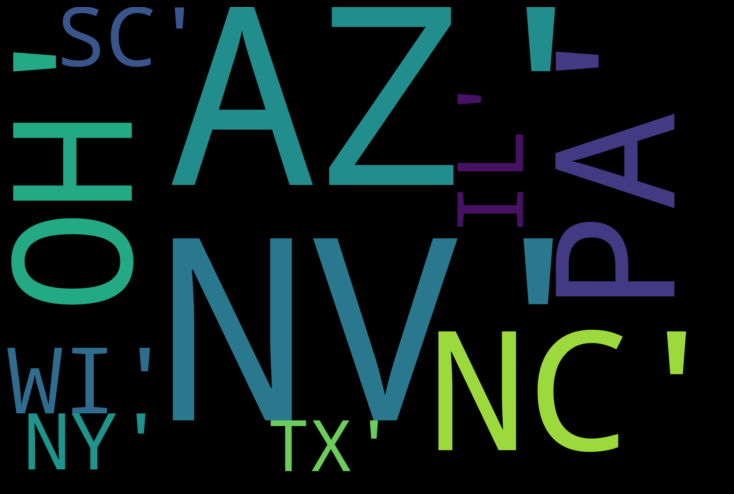

In [ ]:
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black').generate(str(grubhub_and_delivery_takeout_states))

fig = plt.figure(
    figsize = (10, 7),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


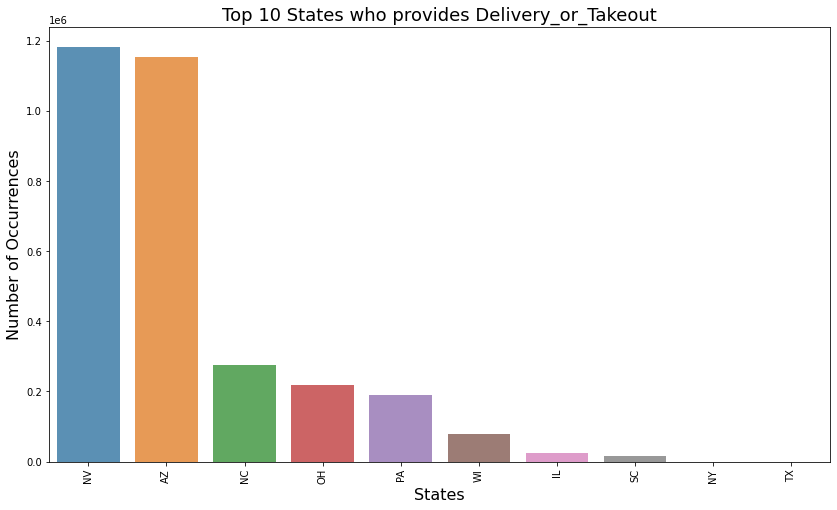

In [ ]:
grubhub_delivery_takeout_states = business_review_df["state"].value_counts()[:10, ]
plt.figure(figsize=(14,8))
sns.barplot(grubhub_delivery_takeout_states.index, grubhub_delivery_takeout_states.values, alpha=0.8)
plt.title('Top 10 States who provides Delivery_or_Takeout', fontsize=18)
plt.ylabel('Number of Occurrences', fontsize=16)
plt.xlabel('States', fontsize=16)
plt.xticks(rotation=90)
plt.show()

## **Top 10 Cities who provides Delivery_or_Takeout:**

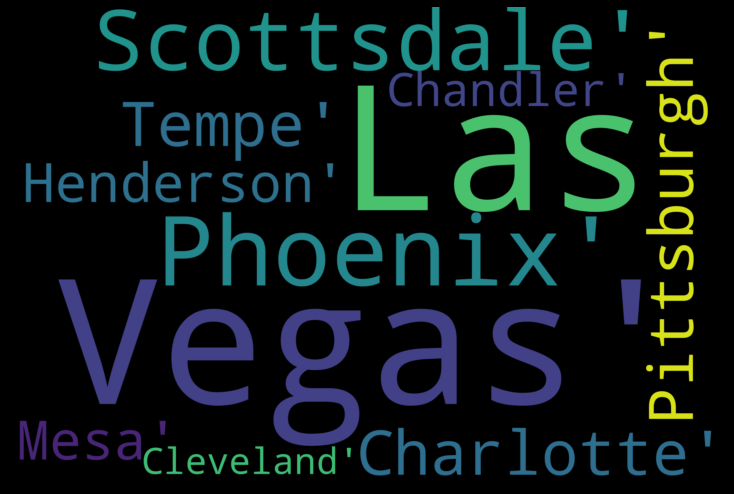

In [ ]:
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black').generate(str(grubhub_and_delivery_takeout_cities))

fig = plt.figure(
    figsize = (10, 7),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


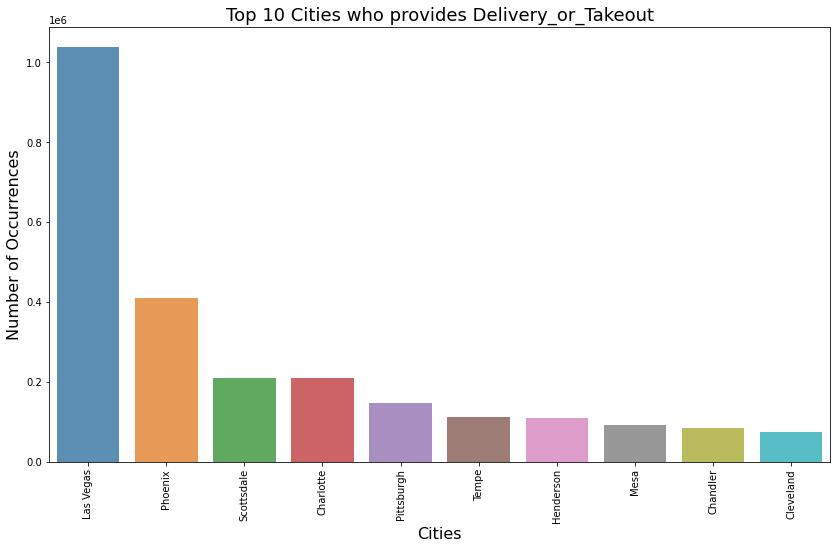

In [ ]:
grubhub_enabled_delivery_takeout_city = business_review_df["city"].value_counts()[:10, ]
plt.figure(figsize=(14,8))
sns.barplot(grubhub_enabled_delivery_takeout_city.index, grubhub_enabled_delivery_takeout_city.values, alpha=0.8)
plt.title('Top 10 Cities who provides Delivery_or_Takeout', fontsize=18)
plt.ylabel('Number of Occurrences', fontsize=16)
plt.xlabel('Cities', fontsize=16)
plt.xticks(rotation=90)
plt.show()

## **Top 10 Restaurants who provides Delivery_or_Takeout:**

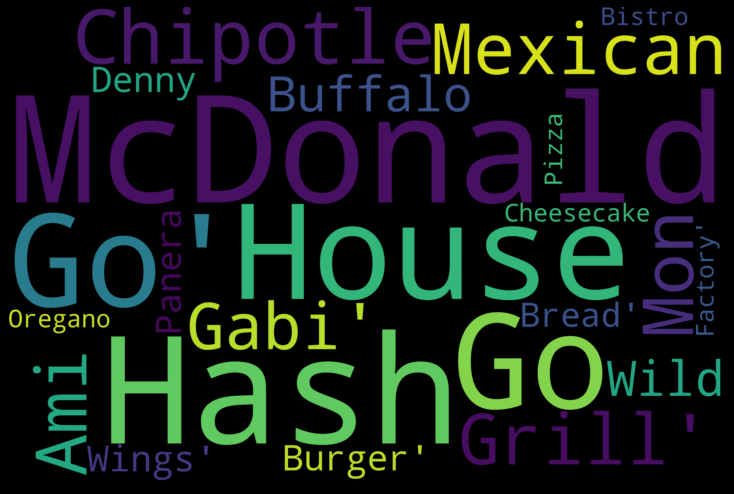

In [ ]:
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black').generate(str(grubhub_and_delivery_takeout_busi))

fig = plt.figure(
    figsize = (10, 7),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


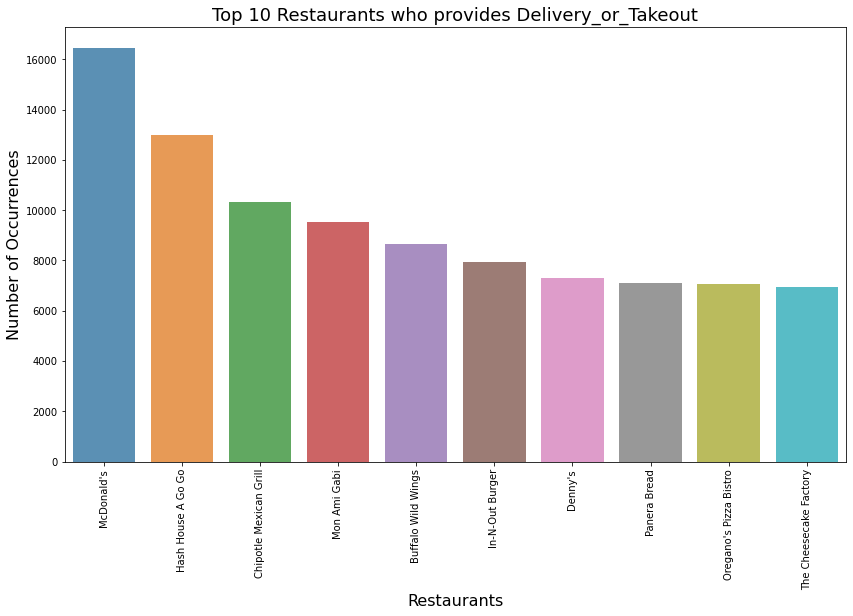

In [ ]:
%matplotlib inline

grubhub_enabled_delivery_takeout  = business_review_df["name"].value_counts()[:10, ]
plt.figure(figsize=(14,8))
sns.barplot(grubhub_enabled_delivery_takeout.index, grubhub_enabled_delivery_takeout.values, alpha=0.8)
plt.title('Top 10 Restaurants who provides Delivery_or_Takeout', fontsize=18)
plt.ylabel('Number of Occurrences', fontsize=16)
plt.xlabel('Restaurants', fontsize=16)
plt.xticks(rotation=90)
plt.show()

# **Filter Top 10 Cities Data:**

In [ ]:
business_review_df = business_review_df[business_review_df["city"].isin(grubhub_and_delivery_takeout_cities)]
print(business_review_df.shape)
business_review_df.head(5)

(2482354, 15)


,business_id,name,city,state,review_count,categories,delivery or takeout,latitude,longitude,review_stars,useful,funny,cool,text,date
5,vjTVxnsQEZ34XjYNS-XUpA,Wetzel's Pretzels,Phoenix,AZ,10,"Food, Pretzels, Bakeries, Fast Food, Restaurants",1,33.602822,-111.983533,5.0,1.0,0.0,1.0,Love Wetzel's pretzels! I always get them when...,2018-07-08 08:44:17
6,vjTVxnsQEZ34XjYNS-XUpA,Wetzel's Pretzels,Phoenix,AZ,10,"Food, Pretzels, Bakeries, Fast Food, Restaurants",1,33.602822,-111.983533,5.0,0.0,0.0,0.0,Wetzels's Pretzels is definitely amazing and v...,2007-06-19 02:16:06
7,vjTVxnsQEZ34XjYNS-XUpA,Wetzel's Pretzels,Phoenix,AZ,10,"Food, Pretzels, Bakeries, Fast Food, Restaurants",1,33.602822,-111.983533,5.0,2.0,5.0,1.0,I love Wetzel's Pretzels. And I can't imagine ...,2007-01-30 17:34:37
8,vjTVxnsQEZ34XjYNS-XUpA,Wetzel's Pretzels,Phoenix,AZ,10,"Food, Pretzels, Bakeries, Fast Food, Restaurants",1,33.602822,-111.983533,4.0,1.0,0.0,0.0,"Never heard of the cheese meltdown pretzel, bu...",2018-09-22 20:38:30
9,vjTVxnsQEZ34XjYNS-XUpA,Wetzel's Pretzels,Phoenix,AZ,10,"Food, Pretzels, Bakeries, Fast Food, Restaurants",1,33.602822,-111.983533,4.0,0.0,0.0,1.0,"PV Mall's food court needs updating, but that ...",2013-07-06 04:11:36


# **2: Top 10 locations that are viable for the restaurant business in the United States. <br>Features: Reviews, Star Ratings and Delivery Services.**

# **Top 10 States with Maximum Reviews, Star Ratings and provides Delivery Services:**


In [ ]:
state_business_reviews = business_review_df[['state', 'review_count', 'review_stars']].groupby(['state']).\
agg({'review_count': 'sum', 'review_stars': 'mean'}).sort_values(by='review_count', ascending=False)
state_business_reviews.head(10)

,review_count,review_stars
state,,
NV,1292951558,3.845887
AZ,491647630,3.837192
NC,75256706,3.724328
PA,50702135,3.789200
OH,22349549,3.824843
SC,28054,3.207101
TX,4546,2.951220
FL,100,1.700000


Text(0, 0.5, 'States')

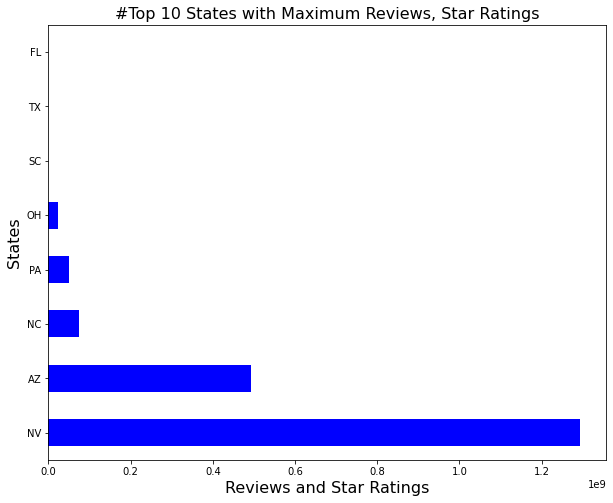

In [ ]:
state_business_reviews['review_count'][0:10].plot(kind='barh', stacked=False, figsize=[10,8], colormap='winter')
plt.title('#Top 10 States with Maximum Reviews, Star Ratings', fontsize=16)
plt.xlabel('Reviews and Star Ratings', fontsize=16)
plt.ylabel('States', fontsize=16)

# **Top 10 Cities with Maximum Reviews, Star Ratings and provides Delivery Services:**


In [ ]:
city_business_reviews = business_review_df[['city', 'review_count', 'review_stars']].groupby(['city']).\
agg({'review_count': 'sum', 'review_stars': 'mean'}).sort_values(by='review_count', ascending=False)
city_business_reviews.head(10)


,review_count,review_stars
city,,
Las Vegas,1238283250,3.850940
Phoenix,248212347,3.855140
Scottsdale,129232668,3.903349
Charlotte,75285016,3.723749
Tempe,56643933,3.778282
Henderson,54675102,3.796064
Pittsburgh,50695341,3.790152
Chandler,29321243,3.751861
Mesa,28241729,3.755540


Text(0, 0.5, 'Cities')

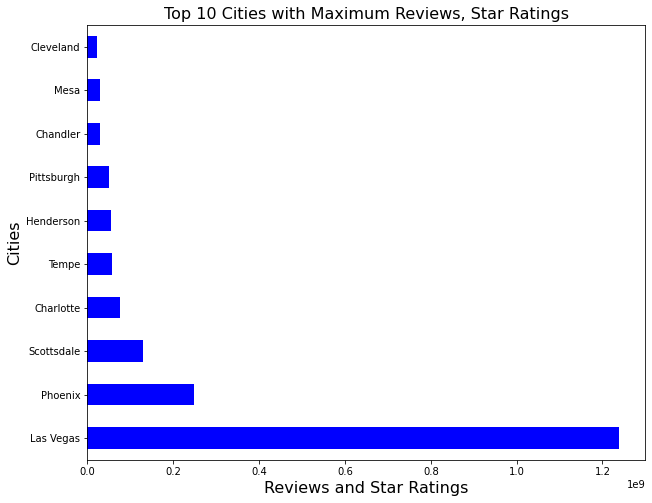

In [ ]:
city_business_reviews['review_count'][0:10].plot(kind='barh', stacked=False, figsize=[10,8], colormap='winter')
plt.title('Top 10 Cities with Maximum Reviews, Star Ratings', fontsize=16)
plt.xlabel('Reviews and Star Ratings', fontsize=16)
plt.ylabel('Cities', fontsize=16)

# **Top 10 Restaurants with Maximum Reviews, Star Ratings and provides Delivery Services:**


In [ ]:
res_business_reviews = business_review_df[['name', 'review_count', 'review_stars']].groupby(['name']).\
agg({'review_count': 'sum', 'review_stars': 'mean'}).sort_values(by='review_count', ascending=False)
res_business_reviews.head(10)

,review_count,review_stars
name,,
Mon Ami Gabi,88341504,4.144610
Hash House A Go Go,60822964,3.824054
Earl of Sandwich,28216950,4.226023
Yardbird Southern Table & Bar,24038612,4.496284
The Cosmopolitan of Las Vegas,23572020,3.846571
Secret Pizza,23448246,4.158542
MGM Grand Hotel,20301736,2.826978
Nacho Daddy,19950292,4.310838
Tacos El Gordo,19707563,4.151444


Text(0, 0.5, 'Restaurants')

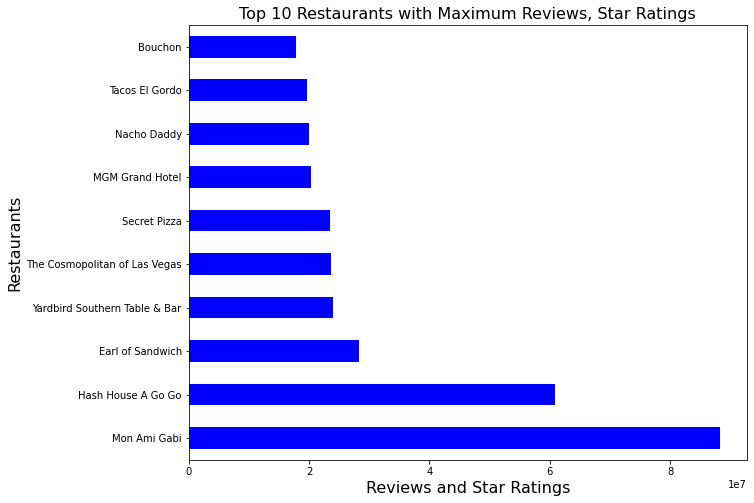

In [ ]:
res_business_reviews['review_count'][0:10].plot(kind='barh', stacked=False, figsize=[10,8], colormap='winter')
plt.title('Top 10 Restaurants with Maximum Reviews, Star Ratings', fontsize=16)
plt.xlabel('Reviews and Star Ratings', fontsize=16)
plt.ylabel('Restaurants', fontsize=16)


## **3: (i) Overall Best Restaurants with good Reviews, Star Ratings and provides Delivery Services are:**

**'Mon Ami Gabi', <br>'Hash House A Go Go', <br> 'Earl of Sandwich', <br>'Yardbird Southern Table & Bar', <br> 'The Cosmopolitan of Las Vegas', <br> 'Secret Pizza', <br>'MGM Grand Hotel', <br>'Nacho Daddy', <br>'Tacos El Gordo', <br>'Bouchon'**

## **3: (ii) For top 10 Restaurants, Review_Counts over the Years:**

In [ ]:
business_review_df["date"]= pd.to_datetime(business_review_df["date"]).dt.date
business_review_df.set_index('date').head(1)
business_review_df["year"] = pd.to_datetime(business_review_df["date"]).dt.year
business_review_df["month"] = pd.to_datetime(business_review_df["date"]).dt.month

In [ ]:
# groupby restaurants
g_res = business_review_df.groupby("name")

#### **'Mon Ami Gabi'**

Text(0, 0.5, 'Review Counts')

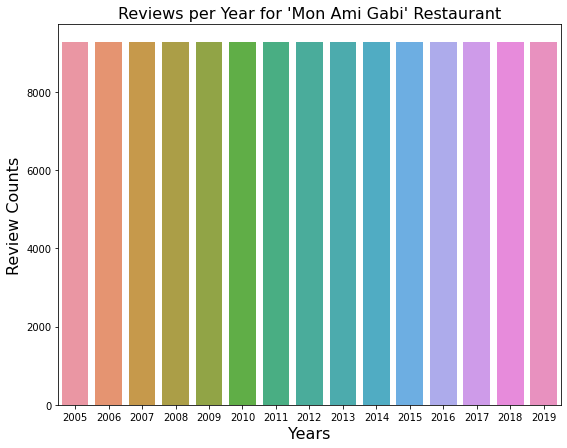

In [ ]:
res_1 = g_res.get_group('Mon Ami Gabi')
plt.figure(figsize=(9, 7))
sns.barplot(x=res_1["year"], y=res_1["review_count"], data=res_1)
plt.title("Reviews per Year for 'Mon Ami Gabi' Restaurant", fontsize=16)
plt.xlabel("Years", fontsize=16)
plt.ylabel("Review Counts", fontsize=16)


#### **'Yardbird Southern Table & Bar'**

Text(0, 0.5, 'Review Counts')

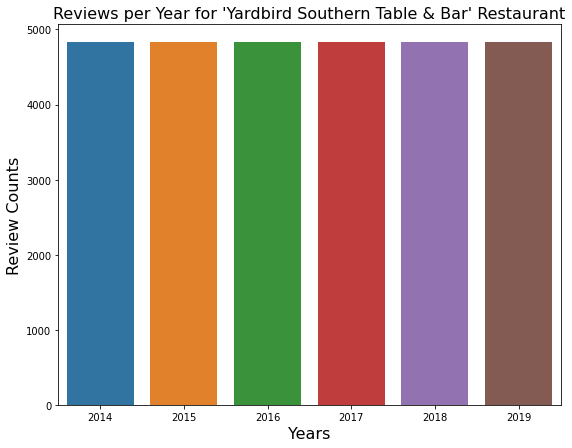

In [ ]:
res_2 = g_res.get_group('Yardbird Southern Table & Bar')
plt.figure(figsize=(9, 7))
sns.barplot(x=res_2["year"], y=res_2["review_count"], data=res_2)
plt.title("Reviews per Year for 'Yardbird Southern Table & Bar' Restaurant", fontsize=16)
plt.xlabel("Years", fontsize=16)
plt.ylabel("Review Counts", fontsize=16)

#### **'Tacos El Gordo'**

Text(0, 0.5, 'Review Counts')

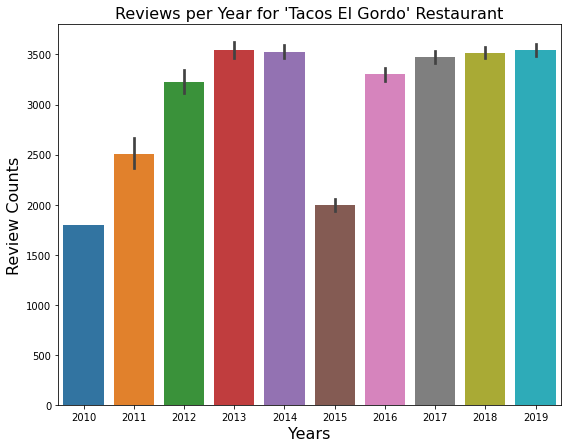

In [ ]:
res_3 = g_res.get_group("Tacos El Gordo")
plt.figure(figsize=(9, 7))
sns.barplot(x=res_3["year"], y=res_3["review_count"], data=res_3)
plt.title("Reviews per Year for 'Tacos El Gordo' Restaurant", fontsize=16)
plt.xlabel("Years", fontsize=16)
plt.ylabel("Review Counts", fontsize=16)

#### **'Nacho Daddy'**

Text(0, 0.5, 'Review Counts')

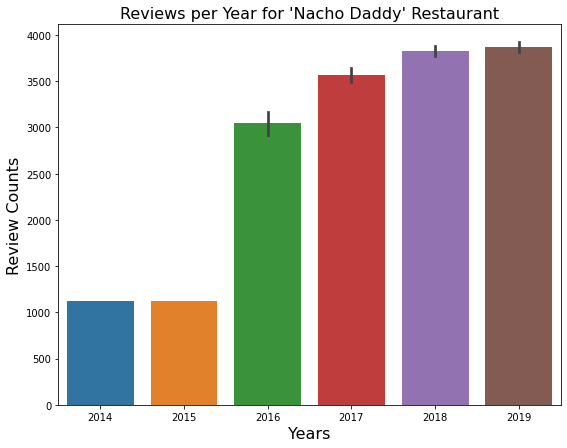

In [ ]:
res_4 = g_res.get_group("Nacho Daddy")
plt.figure(figsize=(9, 7))
sns.barplot(x=res_4["year"], y=res_4["review_count"], data=res_4)
plt.title("Reviews per Year for 'Nacho Daddy' Restaurant", fontsize=16)
plt.xlabel("Years", fontsize=16)
plt.ylabel("Review Counts", fontsize=16)

#### **'Earl of Sandwich':**

Text(0, 0.5, 'Review Counts')

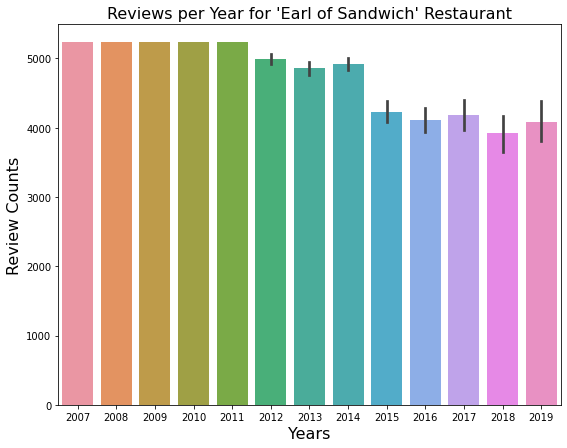

In [ ]:
res_5 = g_res.get_group("Earl of Sandwich")
plt.figure(figsize=(9, 7))
sns.barplot(x=res_5["year"], y=res_5["review_count"], data=res_5)
plt.title("Reviews per Year for 'Earl of Sandwich' Restaurant", fontsize=16)
plt.xlabel("Years", fontsize=16)
plt.ylabel("Review Counts", fontsize=16)

#### **'The Cosmopolitan of Las Vegas':**

Text(0, 0.5, 'Review Counts')

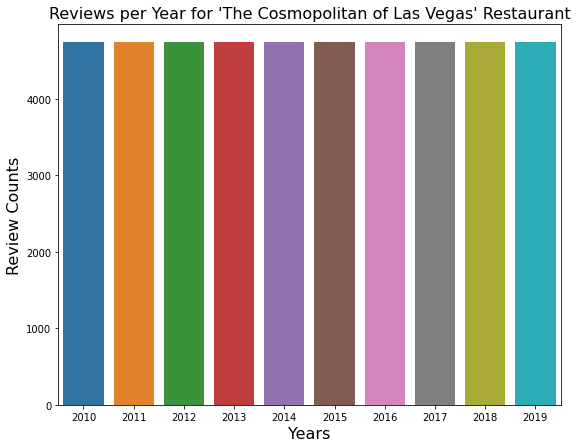

In [ ]:
res_6 = g_res.get_group("The Cosmopolitan of Las Vegas")
plt.figure(figsize=(9, 7))
sns.barplot(x=res_6["year"], y=res_6["review_count"], data=res_6)
plt.title("Reviews per Year for 'The Cosmopolitan of Las Vegas' Restaurant", fontsize=16)
plt.xlabel("Years", fontsize=16)
plt.ylabel("Review Counts", fontsize=16)

#### **'Secret Pizza':**

Text(0, 0.5, 'Review Counts')

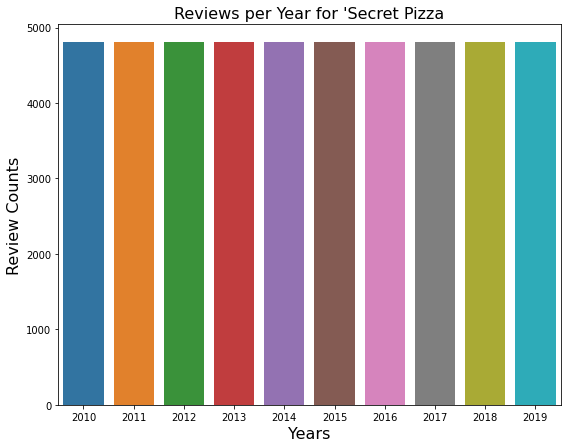

In [ ]:
res_7 = g_res.get_group("Secret Pizza")
plt.figure(figsize=(9, 7))
sns.barplot(x=res_7["year"], y=res_7["review_count"], data=res_7)
plt.title("Reviews per Year for 'Secret Pizza", fontsize=16)
plt.xlabel("Years", fontsize=16)
plt.ylabel("Review Counts", fontsize=16)

#### **'Hash House A Go Go'**

Text(0, 0.5, 'Review Counts')

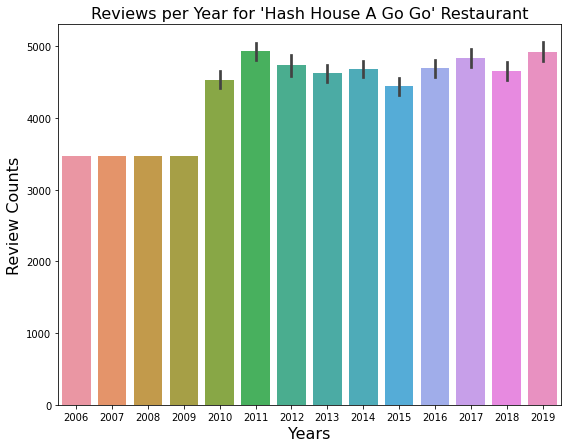

In [ ]:
res_8 = g_res.get_group("Hash House A Go Go")
plt.figure(figsize=(9, 7))
sns.barplot(x=res_8["year"], y=res_8["review_count"], data=res_8)
plt.title("Reviews per Year for 'Hash House A Go Go' Restaurant", fontsize=16)
plt.xlabel("Years", fontsize=16)
plt.ylabel("Review Counts", fontsize=16)

#### **'MGM Grand Hotel':**

Text(0, 0.5, 'Review Counts')

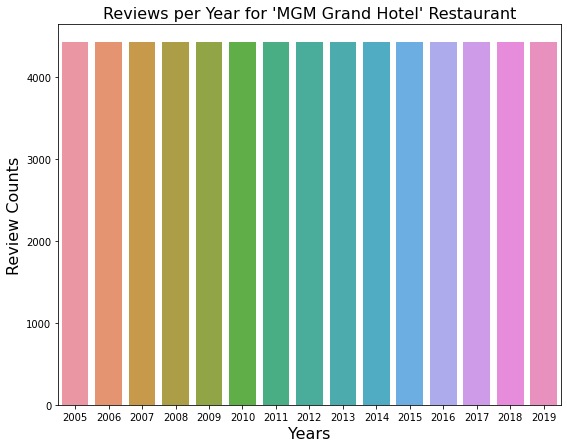

In [ ]:
res_9 = g_res.get_group("MGM Grand Hotel")
plt.figure(figsize=(9, 7))
sns.barplot(x=res_9["year"], y=res_9["review_count"], data=res_9)
plt.title("Reviews per Year for 'MGM Grand Hotel' Restaurant", fontsize=16)
plt.xlabel("Years", fontsize=16)
plt.ylabel("Review Counts", fontsize=16)

#### **'Bouchon':**

Text(0, 0.5, 'Review Counts')

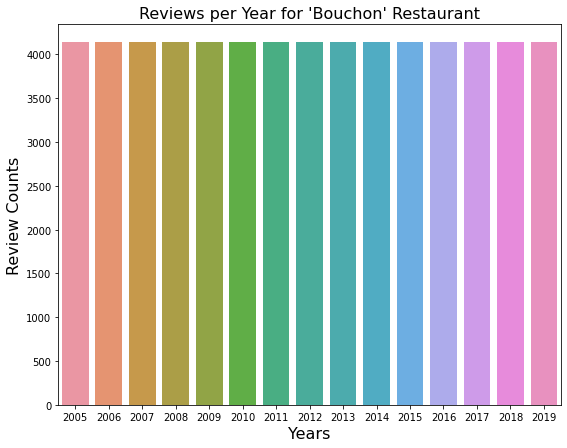

In [ ]:
res_10 = g_res.get_group("Bouchon")
plt.figure(figsize=(9, 7))
sns.barplot(x=res_10["year"], y=res_10["review_count"], data=res_10)
plt.title("Reviews per Year for 'Bouchon' Restaurant", fontsize=16)
plt.xlabel("Years", fontsize=16)
plt.ylabel("Review Counts", fontsize=16)

## **Adding Length_of_Text column:**


In [ ]:
business_review_df["length_of_text"] = business_review_df["text"].apply(lambda x: len(x))
print(business_review_df.shape)

(2482354, 18)


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


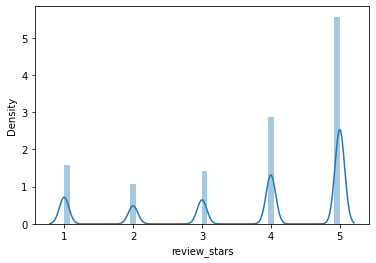

In [ ]:
sns.distplot(business_review_df["review_stars"])

In [ ]:
business_review_df["review_stars"].value_counts()

5.0    1138507
4.0     572655
1.0     296497
3.0     274459
2.0     200236
Name: review_stars, dtype: int64

In [ ]:
business_review_df.rename(columns={"review_stars": "stars"}, inplace=True)

## **4: Spam Review Detection:**


In [ ]:
business_review_df["text"] = business_review_df["text"].apply(lambda x: x.lower())

In [ ]:
business_review_df["text"].value_counts()[:10:]

impressive food and service...\nlove the new tvs....\nthe bartenders are friendly and make the visit fun.\ndoug goes out of his way to provide good service to those sitting at the bar. \n\ngreat food.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                8
pretty good place, i would reccomend it to other people the food is good. its pretty clean. the staff is pretty good. very courteous. did i mention the food was good                                                                                                                                                         

In [ ]:
total_reviews = len(business_review_df["text"])
print("Total Reviews:", total_reviews)
unique_reviews = business_review_df["text"].nunique()
print("Unique Reviews:", unique_reviews)
duplicate_reviews = total_reviews - unique_reviews
print("Duplicate Reviews:", duplicate_reviews)

Total Reviews: 2482354
Unique Reviews: 2474756
Duplicate Reviews: 7598


In [ ]:
print("% of Unique Reviews:", round(((unique_reviews/total_reviews)*100), 2))

% of Unique Reviews: 99.69


In [ ]:
print("% of Duplicate Reviews:", round(((duplicate_reviews/total_reviews)*100), 2))

% of Duplicate Reviews: 0.31


## **Duplicate Text Rating Records:**

In [ ]:
duplicate_text = business_review_df[business_review_df.duplicated('text')] 
print(duplicate_text.shape)
duplicate_text.head(5)

(7598, 18)


,business_id,name,city,state,review_count,categories,delivery or takeout,latitude,longitude,stars,useful,funny,cool,text,date,year,month,length_of_text
211,j9bWpCRwpDVfwVT_V85qeA,Papaya Thai,Mesa,AZ,130,"Food, Ethnic Food, Specialty Food, Restaurants...",1,33.423705,-111.772890,5.0,0.0,0.0,0.0,this is hands down the best thai food i've had...,2015-04-12,2015,4,711
1512,5X7TQsA3iDbBc8yy2YkCnA,Blimpie,Scottsdale,AZ,35,"Restaurants, Sandwiches, Fast Food",1,33.540451,-111.885229,5.0,1.0,0.0,0.0,holy nostalgia! after a yelp search to find lu...,2018-04-12,2018,4,803
1658,VBVqHnViRLSYAqP7v8iNNQ,Jalapeño Inferno,Scottsdale,AZ,247,"Mexican, Restaurants, Food, Salad, Desserts",1,33.674880,-111.888635,3.0,0.0,0.0,0.0,i was there last tuesday evening. the green c...,2016-04-11,2016,4,219
1697,VBVqHnViRLSYAqP7v8iNNQ,Jalapeño Inferno,Scottsdale,AZ,247,"Mexican, Restaurants, Food, Salad, Desserts",1,33.674880,-111.888635,1.0,0.0,0.0,0.0,was looking forward to a great mexican dinner....,2018-04-24,2018,4,421
1892,Yr_w9lakJrKMyEG_hI6zbA,Fat Moe's Pizza & Wings,Las Vegas,NV,141,"Pizza, Salad, Burgers, Restaurants",1,36.099361,-115.226636,5.0,1.0,0.0,0.0,divine intervention lead me to moe's pizza..‍\...,2019-09-29,2019,9,738


In [ ]:
duplicate_text["business_id"].value_counts()[:20:]

l3joBBpkq0ib11dKUpKMAw    758
s2Fv9gzUnnpfnkUTAMSK7w    146
4v0aj1VWtNwvzOeQ2Ohzrg    126
D35unF350QG06LXDe0Cv-Q     84
b5uCtk5iUcdeSWBNAx40Ug     44
JDZ6_yycNQFTpUZzLIKHUg     27
hihud--QRriCYZw1zZvW4g     26
7sb2FYLS2sejZKxRYF9mtg     21
nLGgJBtMfGv7_juXipXheA     19
f4x1YBxkLrZg652xt2KR5g     19
mDR12Hafvr84ctpsV6YLag     17
4JNXUYY8wbaaDmk3BPzlWw     17
fL-b760btOaGa85OJ9ut3w     16
8-_jXGGDFPFAPB4r1x-81w     14
NIOwzgujIXKVBEVNTQBXpg     14
uBdYMY6a6A7FyxzTSwOiDg     14
3kdSl5mo9dWC4clrQjEDGg     13
VyVIneSU7XAWgMBllI6LnQ     13
fHM09_y3QX3n4a_bIFbk_w     12
HhVmDybpU7L50Kb5A0jXTg     12
Name: business_id, dtype: int64

In [ ]:
l3joBBpkq0ib11dKUpKMAw = duplicate_text[duplicate_text["business_id"] == "l3joBBpkq0ib11dKUpKMAw"] 
l3joBBpkq0ib11dKUpKMAw.loc[:, ['business_id', 'stars', 'text']]

,business_id,stars,text
2969425,l3joBBpkq0ib11dKUpKMAw,5.0,great system with great service ! nick is awes...
2969469,l3joBBpkq0ib11dKUpKMAw,4.0,we always come here to hang out and they never...
2969508,l3joBBpkq0ib11dKUpKMAw,4.0,i was craving for chicken wings and came acros...
2969804,l3joBBpkq0ib11dKUpKMAw,4.0,i can't remember very much from when i was her...
2969805,l3joBBpkq0ib11dKUpKMAw,5.0,great venue! kitchen/bar/venue open late. they...
...,...,...,...
2970554,l3joBBpkq0ib11dKUpKMAw,1.0,waiting list is really too long. we came in a...
2970555,l3joBBpkq0ib11dKUpKMAw,5.0,i love this place! always an exceptional time ...
2970556,l3joBBpkq0ib11dKUpKMAw,4.0,this place is so fun! went here for a niece's ...
2970557,l3joBBpkq0ib11dKUpKMAw,5.0,best karaoke studio in las vegas. very nice an...


In [ ]:
l3joBBpkq0ib11dKUpKMAw['text'].value_counts()[:5:]

we always come here to hang out and they never let us down. go here if you want to have fun with friends!!                                                                                                                                                                                                                                3
great system with great service ! nick is awesome ! he's very sweet , funny, and attentive ! last minute accommodations are always appreciated. everywhere we went, it was closed because if fourth of july! thank god they were open and able to accommodate us with a room and great food ! we will be back !                           3
i was craving for chicken wings and came across this place. it is located in chinatown on jones and spring mountain. it is a karaoke joint as well. the food and service was good. although, the wait was a little bit long granted it being 2am. overall, decent spot. \np.s. i felt like i was at a club because of the hyped music.    2
grea

In [ ]:
duplicate_text.loc[:, ['business_id', 'stars', 'text']]

,business_id,stars,text
211,j9bWpCRwpDVfwVT_V85qeA,5.0,this is hands down the best thai food i've had...
1512,5X7TQsA3iDbBc8yy2YkCnA,5.0,holy nostalgia! after a yelp search to find lu...
1658,VBVqHnViRLSYAqP7v8iNNQ,3.0,i was there last tuesday evening. the green c...
1697,VBVqHnViRLSYAqP7v8iNNQ,1.0,was looking forward to a great mexican dinner....
1892,Yr_w9lakJrKMyEG_hI6zbA,5.0,divine intervention lead me to moe's pizza..‍\...
...,...,...,...
3404773,LYgAf_vpMQU6JqBcTXg-Sw,1.0,"5 stars, are you people serious? just a lot of..."
3406217,PIXl4WvAqjl2w9Lj81zXvQ,5.0,have been here quite a few times and love the ...
3406250,PIXl4WvAqjl2w9Lj81zXvQ,3.0,food was good! but very slow service. i have t...
3406715,PIXl4WvAqjl2w9Lj81zXvQ,5.0,always my favorite go to restaurant. we've bee...


#### **Conclusion: It looks like Reviews are unique for same Business_id as well, There are only 0.3% Reviews are duplicate which is negligible, i.e. people don't give fake Reviews.**

## **5: Correlation between the 'length of the review text' and the 'star rating' of the restaurants:**

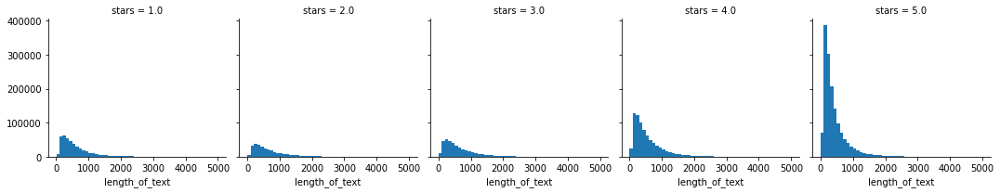

In [ ]:
g = sns.FacetGrid(data=business_review_df, col='stars')
g.map(plt.hist, 'length_of_text', bins=50)

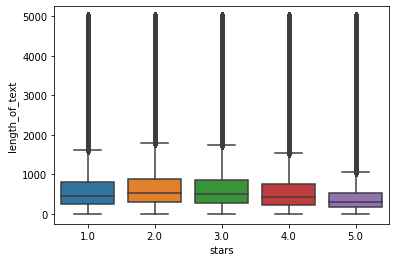

In [ ]:
sns.boxplot(x='stars', y='length_of_text', data=business_review_df)

#### **From the plot, looks like the 2-star and 3-star ratings have much longer text, but there are many outliers (which can be seen as points above the boxes). Because of this, maybe text length won’t be such a useful feature to consider after all.**

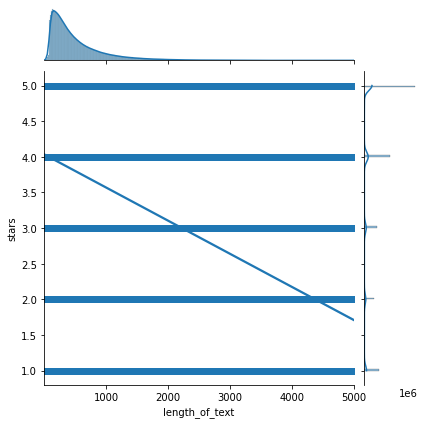

In [ ]:
sns.jointplot(x=business_review_df["length_of_text"],
              y=business_review_df["stars"],
              data=business_review_df, kind='reg')

#### **It Looks like as length of text increases the rating is decreasing !! as per the graph.**

In [ ]:
# Let’s group the data by the star rating, and see if we can find a correlation between features such as cool, useful, and funny. 
stars = business_review_df.groupby('stars').mean()
stars.corr()


,review_count,delivery or takeout,latitude,longitude,useful,funny,cool,year,month,length_of_text
review_count,1.000000,NaN,0.556231,0.296066,-0.072898,-0.181096,0.886480,-0.521229,-0.740713,-0.531176
delivery or takeout,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
latitude,0.556231,NaN,1.000000,0.914729,0.731964,0.685068,0.813710,-0.957958,-0.879360,0.321685
longitude,0.296066,NaN,0.914729,1.000000,0.914916,0.871437,0.597396,-0.969295,-0.831821,0.623502
useful,-0.072898,NaN,0.731964,0.914916,1.000000,0.989837,0.326764,-0.801471,-0.546154,0.802143
funny,-0.181096,NaN,0.685068,0.871437,0.989837,1.000000,0.230725,-0.733613,-0.453045,0.850156
cool,0.886480,NaN,0.813710,0.597396,0.326764,0.230725,1.000000,-0.764171,-0.821633,-0.250661
year,-0.521229,NaN,-0.957958,-0.969295,-0.801471,-0.733613,-0.764171,1.000000,0.931747,-0.417904
month,-0.740713,NaN,-0.879360,-0.831821,-0.546154,-0.453045,-0.821633,0.931747,1.000000,-0.173296
length_of_text,-0.531176,NaN,0.321685,0.623502,0.802143,0.850156,-0.250661,-0.417904,-0.173296,1.000000


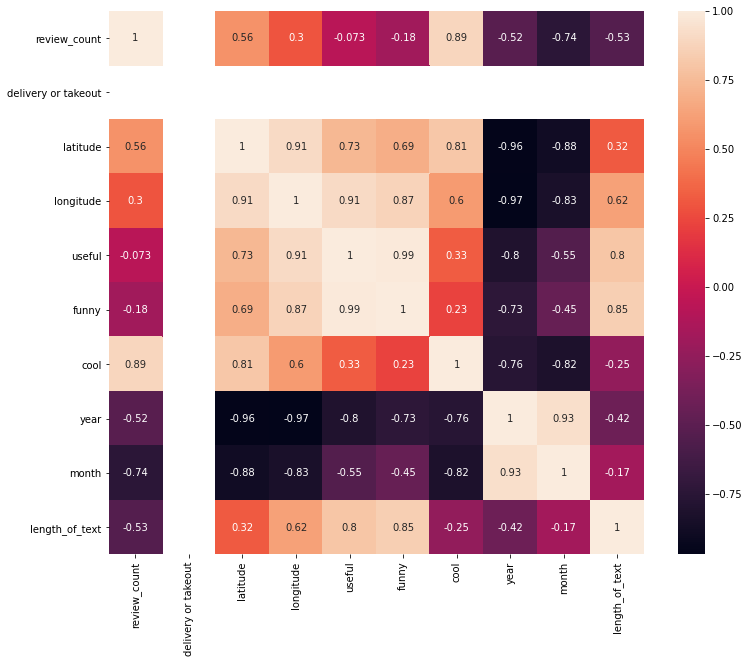

In [ ]:
# To visualise these correlations, we can use Seaborn’s heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(data=stars.corr(), annot=True)

#### **We can see that there is negative correlation between:**
* **Length_of_text and review_count**

#### **Thus, we can say that the reviews marked cool tend to be curt, not very useful to others and short.**

#### **Whereas, there is a positive correlation between:**
* **Funny and Useful** 
* **Funny and Length_of_text**
* **Useful and Length_of_text** 
* **cool and review_count**
#### **Thus, we can say that longer reviews tend to be funny and useful.**

## **6: Which are the top chain restaurants in the United States? How are they reviewed?**


### **Top 10 Restaurants Names with maximum Branches:**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


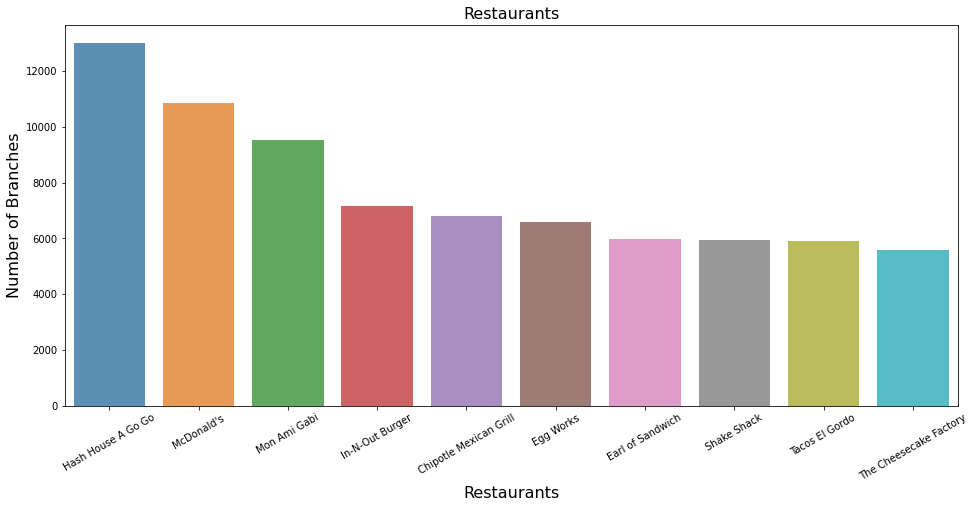

In [ ]:
%matplotlib inline
restaurants_count  = business_review_df["name"].value_counts()[:10,]
restaurants_count = restaurants_count[:10,]
plt.figure(figsize=(16,7))
sns.barplot(restaurants_count.index, restaurants_count.values, alpha=0.8)
plt.title('Restaurants', fontsize=16)
plt.ylabel('Number of Branches', fontsize=16)
plt.xlabel('Restaurants', fontsize=16)
plt.xticks(rotation=30)
plt.show()

In [ ]:
restaurants_count

Hash House A Go Go        13004
McDonald's                10853
Mon Ami Gabi               9536
In-N-Out Burger            7150
Chipotle Mexican Grill     6796
Egg Works                  6591
Earl of Sandwich           5964
Shake Shack                5946
Tacos El Gordo             5923
The Cheesecake Factory     5575
Name: name, dtype: int64


## **7: For a new restaurant what are some of the best combinations of cuisines or food items to serve:**


### **Top Cuisine Served by Restaurants:**

In [ ]:
restaurant_data=business_covid_checkin_df['categories']
restaurant_data

0        Ethnic Food, Food Trucks, Specialty Food, Impo...
1         Food, Pretzels, Bakeries, Fast Food, Restaurants
2                          Restaurants, Fast Food, Burgers
3        Bars, Arts & Entertainment, Nightlife, Music V...
4        Shopping Centers, Food, Coffee & Tea, Cafes, M...
                               ...                        
23947    Shopping, Party & Event Planning, Caterers, To...
23948                                 Chinese, Restaurants
23949    Nightlife, American (Traditional), Chicken Win...
23950    Restaurants, Pizza, Sandwiches, Fast Food, Chi...
23951    American (New), Food, Burgers, Restaurants, Fa...
Name: categories, Length: 23952, dtype: object

In [ ]:
j=0
a=[]
b=[]
for i in restaurant_data:
    temp1=str(i)
    temp1=temp1.split(",")
    temp=[]
    for k in temp1:
        temp.append(k.strip(" "))
    # filter out certain unwanted attributes such as Art, Casinos and generic keywords such as Restaurant, Bars etc
    temp= [k for k in temp if 'Bars' not in k]
    temp= [k for k in temp if 'Restaurants' not in k]
    temp= [k for k in temp if 'Food' not in k]
    temp= [k for k in temp if 'Nightlife' not in k]
    temp= [k for k in temp if 'Beer' not in k]
    temp= [k for k in temp if 'Arts' not in k]
    temp= [k for k in temp if 'Events' not in k]
    temp= [k for k in temp if 'Caterers' not in k]
    temp= [k for k in temp if 'Hotels' not in k]
    temp= [k for k in temp if 'Casinos' not in k]
    temp= [k for k in temp if 'Event Planning & Services' not in k]
    temp= [k for k in temp if 'Active Life' not in k]
    temp= [k for k in temp if 'Art Galleries' not in k]
    temp= [k for k in temp if 'Gas Stations' not in k]
    temp= [k for k in temp if 'Day Spas' not in k]
    temp= [k for k in temp if  'Books' not in k]
    temp= [k for k in temp if ' Event Planning & Services' not in k]
    temp= [k for k in temp if 'Department Stores' not in k]
    temp= [k for k in temp if 'Furniture Stores' not in k]
    temp= [k for k in temp if 'Home & Garden' not in k]    
    temp= [k for k in temp if 'Fashion' not in k]
    temp= [k for k in temp if 'Electronics' not in k]
    temp= [k for k in temp if 'Shopping' not in k]
    temp= [k for k in temp if 'Breakfast & Brunch' not in k]
    temp= [k for k in temp if 'American (New)' not in k]
    temp= [k for k in temp if 'Sandwiches' not in k]
    temp= [k for k in temp if 'Salads' not in k]
    temp= [k for k in temp if 'Hair Removal' not in k]
    temp= [k for k in temp if 'Skin Care' not in k]
    temp= [k for k in temp if 'Beauty & Spas' not in k]
    temp= [k for k in temp if 'Waxing' not in k]
    temp= [k for k in temp if 'Pet Groomers' not in k]
    temp= [k for k in temp if 'Pet Services' not in k]
    temp= [k for k in temp if 'Pet Training' not in k]
    temp= [k for k in temp if 'Pet Stores' not in k]
    temp= [k for k in temp if 'Pubs' not in k]
    temp= [k for k in temp if "Men's Clothing" not in k]
    temp= [k for k in temp if "Women's Clothing" not in k]
    temp= [k for k in temp if 'Shoe Stores' not in k]
    temp= [k for k in temp if 'Automotive' not in k]
    temp= [k for k in temp if 'Convenience Stores' not in k]
    temp= [k for k in temp if 'Grocery' not in k]

    a.append(temp)
    b=b+temp
    j=j+1

In [ ]:
cuisine = pd.DataFrame(b)
cuisine.shape

(46250, 1)

## **Top 20 Cuisines:**

In [ ]:
top_cuisines = cuisine[0].value_counts()[:20:].index.tolist()
top_cuisines

['American (Traditional)',
 'Pizza',
 'Burgers',
 'Mexican',
 'Italian',
 'Salad',
 'Chicken Wings',
 'Chinese',
 'Coffee & Tea',
 'Seafood',
 'Delis',
 'Cafes',
 'Japanese',
 'Asian Fusion',
 'Steakhouses',
 'Tacos',
 'Desserts',
 'Diners',
 'Barbeque',
 'Wine & Spirits']

Total count of repetitive categories/cusines in the Restaurant data:  46250

Cusine Distribution of Top 20 by frequency: 


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


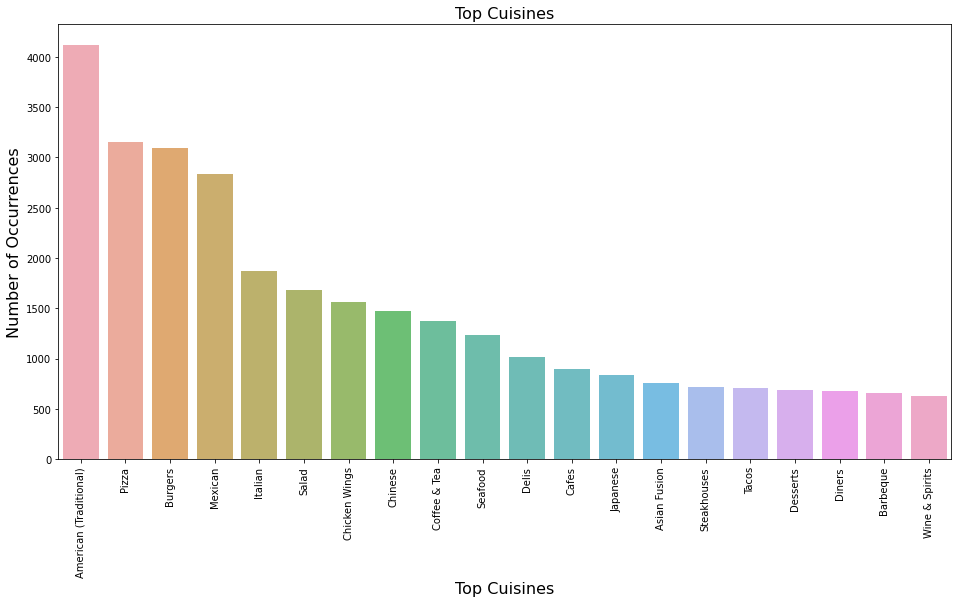

In [ ]:
print('Total count of repetitive categories/cusines in the Restaurant data: ',len(b))
print('\nCusine Distribution of Top 20 by frequency: ')

top_cuisine  = cuisine[0].value_counts()[:20:]
plt.figure(figsize=(16,8))
sns.barplot(top_cuisine.index, top_cuisine.values, alpha=0.8)
plt.title('Top Cuisines', fontsize=16)
plt.ylabel('Number of Occurrences', fontsize=16)
plt.xlabel('Top Cuisines', fontsize=16)
plt.xticks(rotation=90)
plt.show()

### **Top 20 Cuisine WordCloud:**

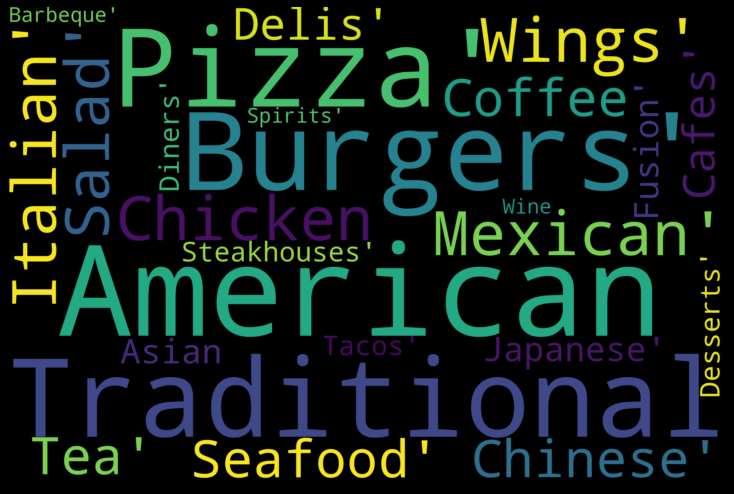

In [ ]:
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(top_cuisines))

fig = plt.figure(
    figsize = (10, 7),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)

### **Combination of things, Restaurants can offer together:**

In [ ]:
!pip install apyori

  Created wheel for apyori: filename=apyori-1.1.2-cp37-none-any.whl size=5975 sha256=89f730dd345e2840de3baf5d6b6ce977ab0934aa32cfb07a7ee3d87b0d4a3b59
  Stored in directory: /root/.cache/pip/wheels/5d/92/bb/474bbadbc8c0062b9eb168f69982a0443263f8ab1711a8cad0
Successfully built apyori


In [ ]:
from apyori import apriori  

association_rules = apriori(a, min_support=0.0017, min_confidence=0.40, min_lift=1, min_length=2)  
association_results = list(association_rules)  

combined_cuisines_rules = []
for item in association_results:

    # first index of the inner list
    # Contains base item and add item
    
    pair = item[0] 
    items = [x for x in pair]

    combined_cuisines_rules.append(items)
    print("Rule:", items)

    #second index of the inner list
    print("Support: " + str(item[1]))

    #third index of the list located at 0th
    #of the third index of the inner list

    print("Confidence: " + str(item[2][0][2]))
    print("Lift: " + str(item[2][0][3]))
    print("=====================================")

Rule: ['Bed & Breakfast', 'American (Traditional)']
Support: 0.0017117568470273882
Confidence: 0.9111111111111112
Lift: 5.301976028506641
Rule: ['Diners', 'American (Traditional)']
Support: 0.01690881763527054
Confidence: 0.6017830609212481
Lift: 3.501921252474668
Rule: ['Gastropubs', 'American (Traditional)']
Support: 0.0038827655310621242
Confidence: 0.4043478260869565
Lift: 2.352997845100773
Rule: ['American (Traditional)', 'Southern']
Support: 0.005260521042084168
Confidence: 0.4214046822742475
Lift: 2.4522558187154457
Rule: ['Steakhouses', 'American (Traditional)']
Support: 0.012692050768203072
Confidence: 0.4222222222222222
Lift: 2.457013281503077
Rule: ['Breweries', 'Brewpubs']
Support: 0.001920507682030728
Confidence: 1.0
Lift: 121.58375634517765
Rule: ['Burgers', 'Hot Dogs']
Support: 0.007974281897127589
Confidence: 0.5204359673024523
Lift: 4.027619479427574
Rule: ['Burgers', 'Ice Cream & Frozen Yogurt']
Support: 0.010771543086172345
Confidence: 0.5572354211663066
Lift: 4.3124

In [ ]:
unique_cuisines = []
for i in combined_cuisines_rules:
  for j in i:
    if j not in unique_cuisines:
      unique_cuisines.append(j)
print(len(unique_cuisines))

58


In [ ]:
# Filter business_df by unique_cuisines:

top_cuisine = []
for i in business_review_df["categories"]:
  if ('American (Traditional)' in i) or \
  ('Pizza' in i) or \
  ('Mexican' in i) or \
  ('Burgers' in i) or \
  ('Italian' in i) or \
  ('Salad' in i) or \
  ('Chicken Wings' in i) or \
  ('Chinese' in i) or \
  ('Coffee & Tea' in i) or \
  ('Seafood' in i) or \
  ('Delis' in i) or \
  ('Cafes' in i) or \
  ('Japanese' in i) or \
  ('Asian Fusion' in i) or \
  ('Steakhouses' in i) or \
  ('Tacos' in i) or \
  ('Desserts' in i) or \
  ('Diners' in i) or \
  ('Barbeque' in i) or \
  ('Wine & Spirits' in i):
    top_cuisine.append(1)
  else:
    top_cuisine.append(0)

business_review_df["top_cuisine"] = top_cuisine
business_review_df


,business_id,name,city,state,review_count,categories,delivery or takeout,latitude,longitude,stars,useful,funny,cool,text,date,year,month,length_of_text,top_cuisine
5,vjTVxnsQEZ34XjYNS-XUpA,Wetzel's Pretzels,Phoenix,AZ,10,"Food, Pretzels, Bakeries, Fast Food, Restaurants",1,33.602822,-111.983533,5.0,1.0,0.0,1.0,love wetzel's pretzels! i always get them when...,2018-07-08,2018,7,240,0
6,vjTVxnsQEZ34XjYNS-XUpA,Wetzel's Pretzels,Phoenix,AZ,10,"Food, Pretzels, Bakeries, Fast Food, Restaurants",1,33.602822,-111.983533,5.0,0.0,0.0,0.0,wetzels's pretzels is definitely amazing and v...,2007-06-19,2007,6,460,0
7,vjTVxnsQEZ34XjYNS-XUpA,Wetzel's Pretzels,Phoenix,AZ,10,"Food, Pretzels, Bakeries, Fast Food, Restaurants",1,33.602822,-111.983533,5.0,2.0,5.0,1.0,i love wetzel's pretzels. and i can't imagine ...,2007-01-30,2007,1,355,0
8,vjTVxnsQEZ34XjYNS-XUpA,Wetzel's Pretzels,Phoenix,AZ,10,"Food, Pretzels, Bakeries, Fast Food, Restaurants",1,33.602822,-111.983533,4.0,1.0,0.0,0.0,"never heard of the cheese meltdown pretzel, bu...",2018-09-22,2018,9,351,0
9,vjTVxnsQEZ34XjYNS-XUpA,Wetzel's Pretzels,Phoenix,AZ,10,"Food, Pretzels, Bakeries, Fast Food, Restaurants",1,33.602822,-111.983533,4.0,0.0,0.0,1.0,"pv mall's food court needs updating, but that ...",2013-07-06,2013,7,429,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3408967,SYa2j1boLF8DcGVOYfHPcA,Five Guys,Scottsdale,AZ,97,"American (New), Food, Burgers, Restaurants, Fa...",1,33.504062,-111.929431,5.0,1.0,1.0,0.0,time for one great cheeseburger. face it - thi...,2018-01-01,2018,1,382,1
3408968,SYa2j1boLF8DcGVOYfHPcA,Five Guys,Scottsdale,AZ,97,"American (New), Food, Burgers, Restaurants, Fa...",1,33.504062,-111.929431,1.0,0.0,1.0,0.0,i'm 6.5 months pregnant and asked for a bigger...,2016-03-31,2016,3,318,1
3408969,SYa2j1boLF8DcGVOYfHPcA,Five Guys,Scottsdale,AZ,97,"American (New), Food, Burgers, Restaurants, Fa...",1,33.504062,-111.929431,1.0,2.0,1.0,1.0,can you say dog poop in your mouth? cuz that's...,2011-12-04,2011,12,283,1
3408970,SYa2j1boLF8DcGVOYfHPcA,Five Guys,Scottsdale,AZ,97,"American (New), Food, Burgers, Restaurants, Fa...",1,33.504062,-111.929431,4.0,1.0,1.0,1.0,mall shopping with my friend always gets me hu...,2019-11-08,2019,11,644,1


In [ ]:
business_review_df = business_review_df[business_review_df["top_cuisine"] == 1]
print(business_review_df.shape)

(2048812, 19)


## **Top Restaurants by Cuisines:**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


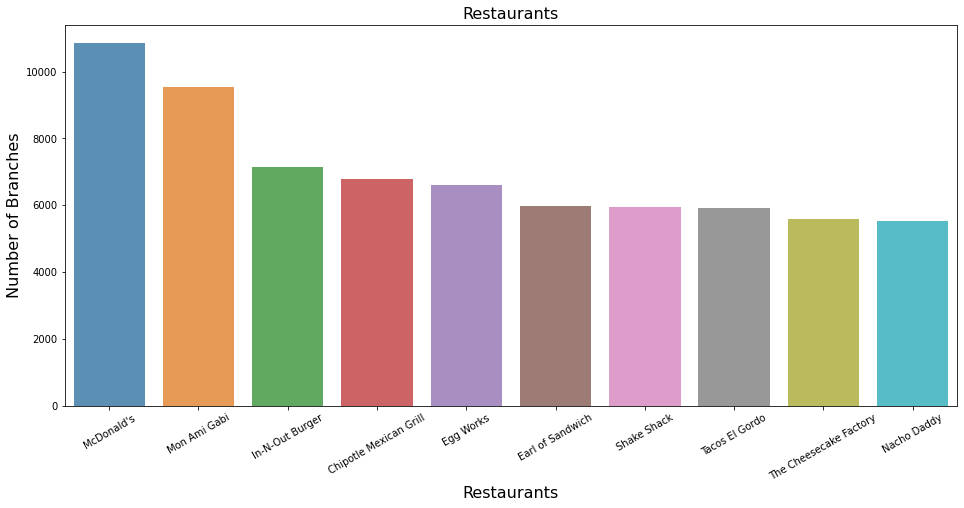

In [ ]:
%matplotlib inline
restaurants_count  = business_review_df["name"].value_counts()[:10,]
restaurants_count = restaurants_count[:10,]
plt.figure(figsize=(16,7))
sns.barplot(restaurants_count.index, restaurants_count.values, alpha=0.8)
plt.title('Restaurants', fontsize=16)
plt.ylabel('Number of Branches', fontsize=16)
plt.xlabel('Restaurants', fontsize=16)
plt.xticks(rotation=30)
plt.show()

In [ ]:
restaurants_count

McDonald's                10853
Mon Ami Gabi               9536
In-N-Out Burger            7150
Chipotle Mexican Grill     6796
Egg Works                  6591
Earl of Sandwich           5964
Shake Shack                5946
Tacos El Gordo             5923
The Cheesecake Factory     5575
Nacho Daddy                5527
Name: name, dtype: int64

## **8: Variation in the reviews for restaurants on the basis of cuisines over the year?**



In [ ]:
# groupby restaurants
g_res = business_review_df.groupby("name")

### **McDonald's:**

Text(0, 0.5, 'Review Counts')

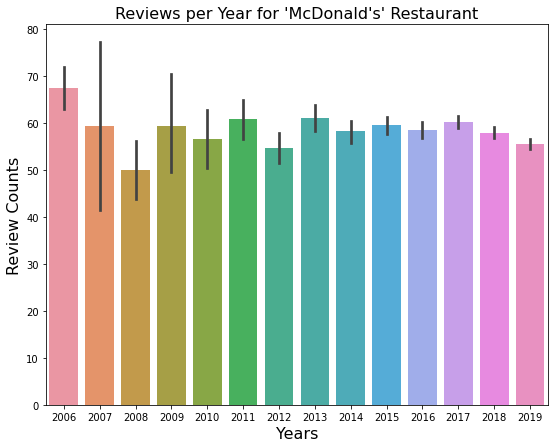

In [ ]:
res_1 = g_res.get_group("McDonald's")
plt.figure(figsize=(9, 7))
sns.barplot(x=res_1["year"], y=res_1["review_count"], data=res_1)
plt.title("Reviews per Year for 'McDonald's' Restaurant", fontsize=16)
plt.xlabel("Years", fontsize=16)
plt.ylabel("Review Counts", fontsize=16)

### **Chipotle Mexican Grill:**

Text(0, 0.5, 'Review Counts')

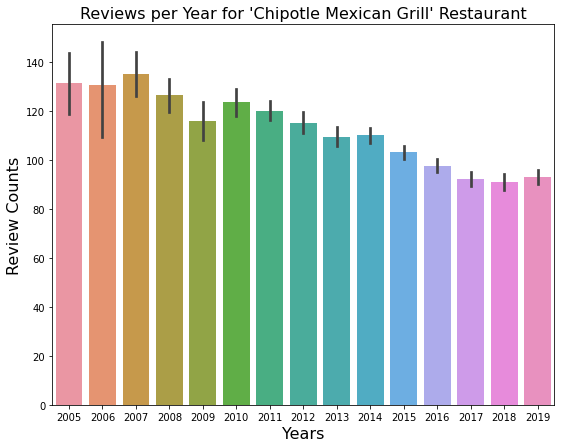

In [ ]:
res_2 = g_res.get_group("Chipotle Mexican Grill")
plt.figure(figsize=(9, 7))
sns.barplot(x=res_2["year"], y=res_2["review_count"], data=res_2)
plt.title("Reviews per Year for 'Chipotle Mexican Grill' Restaurant", fontsize=16)
plt.xlabel("Years", fontsize=16)
plt.ylabel("Review Counts", fontsize=16)

### **Mon Ami Gabi:**

Text(0, 0.5, 'Review Counts')

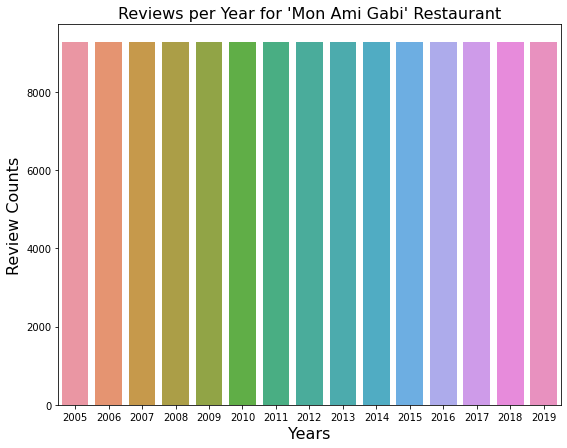

In [ ]:
res_3 = g_res.get_group("Mon Ami Gabi")
plt.figure(figsize=(9, 7))
sns.barplot(x=res_3["year"], y=res_3["review_count"], data=res_3)
plt.title("Reviews per Year for 'Mon Ami Gabi' Restaurant", fontsize=16)
plt.xlabel("Years", fontsize=16)
plt.ylabel("Review Counts", fontsize=16)

### **Egg Works:**    

Text(0, 0.5, 'Review Counts')

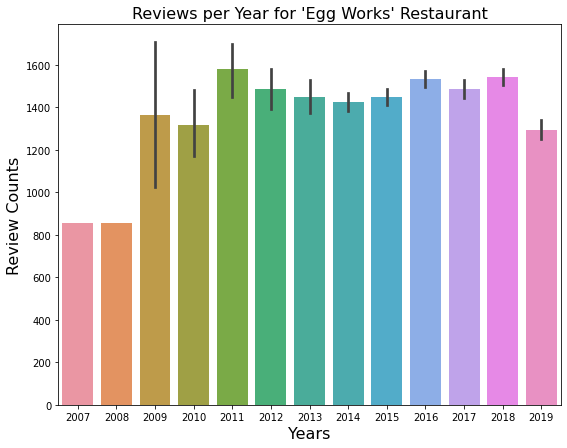

In [ ]:
res_4 = g_res.get_group("Egg Works")
plt.figure(figsize=(9, 7))
sns.barplot(x=res_4["year"], y=res_4["review_count"], data=res_4)
plt.title("Reviews per Year for 'Egg Works' Restaurant", fontsize=16)
plt.xlabel("Years", fontsize=16)
plt.ylabel("Review Counts", fontsize=16)

### **In-N-Out Burger:**

Text(0, 0.5, 'Review Counts')

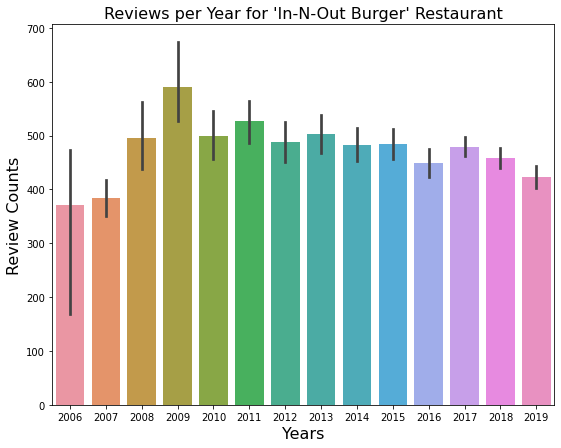

In [ ]:
res_5 = g_res.get_group("In-N-Out Burger")
plt.figure(figsize=(9, 7))
sns.barplot(x=res_5["year"], y=res_5["review_count"], data=res_5)
plt.title("Reviews per Year for 'In-N-Out Burger' Restaurant", fontsize=16)
plt.xlabel("Years", fontsize=16)
plt.ylabel("Review Counts", fontsize=16)

### **Earl of Sandwich:** 

Text(0, 0.5, 'Review Counts')

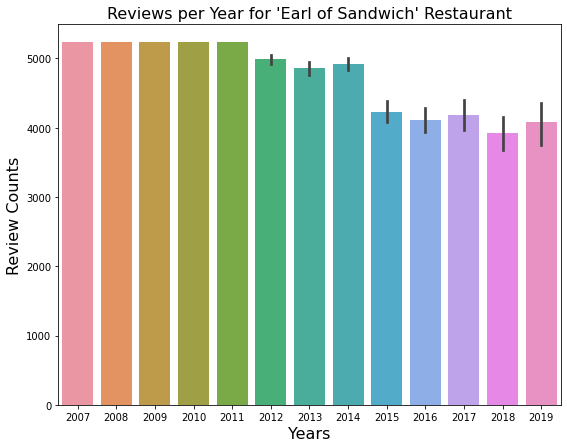

In [ ]:
res_6 = g_res.get_group("Earl of Sandwich")
plt.figure(figsize=(9, 7))
sns.barplot(x=res_6["year"], y=res_6["review_count"], data=res_6)
plt.title("Reviews per Year for 'Earl of Sandwich' Restaurant", fontsize=16)
plt.xlabel("Years", fontsize=16)
plt.ylabel("Review Counts", fontsize=16)

### **Shake Shack:**


Text(0, 0.5, 'Review Counts')

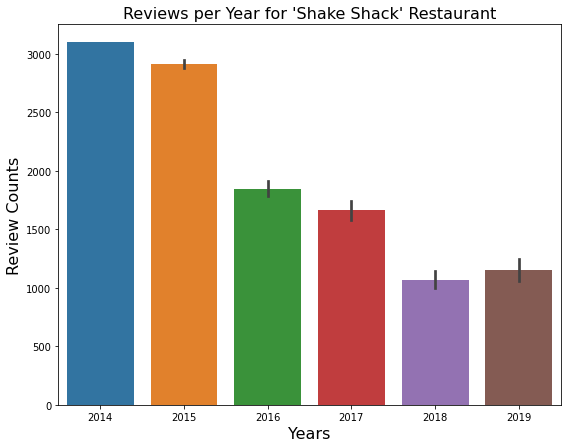

In [ ]:
res_7 = g_res.get_group("Shake Shack")
plt.figure(figsize=(9, 7))
sns.barplot(x=res_7["year"], y=res_7["review_count"], data=res_7)
plt.title("Reviews per Year for 'Shake Shack' Restaurant", fontsize=16)
plt.xlabel("Years", fontsize=16)
plt.ylabel("Review Counts", fontsize=16)


### **Tacos El Gordo:**


Text(0, 0.5, 'Review Counts')

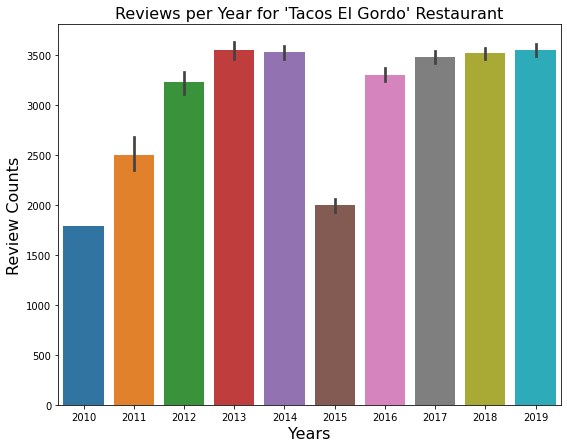

In [ ]:
res_8 = g_res.get_group("Tacos El Gordo")
plt.figure(figsize=(9, 7))
sns.barplot(x=res_8["year"], y=res_8["review_count"], data=res_8)
plt.title("Reviews per Year for 'Tacos El Gordo' Restaurant", fontsize=16)
plt.xlabel("Years", fontsize=16)
plt.ylabel("Review Counts", fontsize=16)


### **The Cheesecake Factory:**
 

Text(0, 0.5, 'Review Counts')

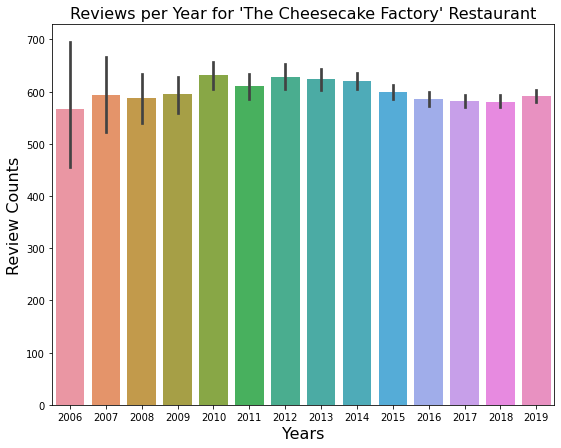

In [ ]:
res_9 = g_res.get_group("The Cheesecake Factory")
plt.figure(figsize=(9, 7))
sns.barplot(x=res_9["year"], y=res_9["review_count"], data=res_9)
plt.title("Reviews per Year for 'The Cheesecake Factory' Restaurant", fontsize=16)
plt.xlabel("Years", fontsize=16)
plt.ylabel("Review Counts", fontsize=16)


### **Nacho Daddy:**

Text(0, 0.5, 'Review Counts')

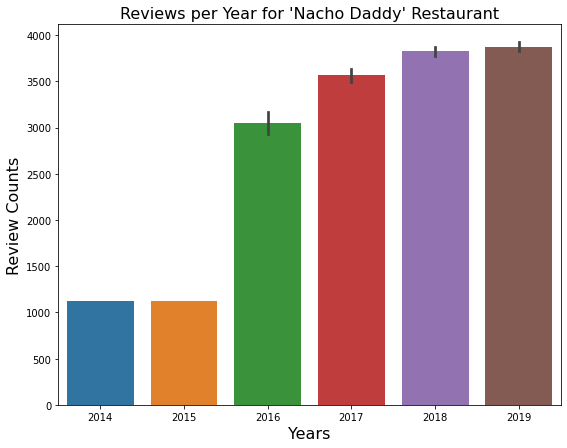

In [ ]:
res_10 = g_res.get_group("Nacho Daddy")
plt.figure(figsize=(9, 7))
sns.barplot(x=res_10["year"], y=res_10["review_count"], data=res_10)
plt.title("Reviews per Year for 'Nacho Daddy' Restaurant", fontsize=16)
plt.xlabel("Years", fontsize=16)
plt.ylabel("Review Counts", fontsize=16)


## **9: Visualize a map representation of popular restaurants based on findings for selected locations that have identified.**

## **Filter Top 10 Restaurants Data:**

In [ ]:
plot_res_data = business_review_df[business_review_df["name"].isin(["McDonald's", "Chipotle Mexican Grill", "Mon Ami Gabi",
              "Egg Works", "In-N-Out Burger", "Earl of Sandwich",
              "Shake Shack", "Nacho Daddy",
              "The Cheesecake Factory", "Tacos El Gordo"])]
print(plot_res_data.shape)
plot_res_data.head(5)


(69861, 19)


,business_id,name,city,state,review_count,categories,delivery or takeout,latitude,longitude,stars,useful,funny,cool,text,date,year,month,length_of_text,top_cuisine
7819,WUmosjOxt_8nWByHgm8Kkg,Chipotle Mexican Grill,Chandler,AZ,99,"Restaurants, Tex-Mex, Mexican, Fast Food",1,33.317426,-111.96897,5.0,0.0,0.0,0.0,who knew?\n \ni did! \n\ni remember eating man...,2011-01-08,2011,1,618,1
7820,WUmosjOxt_8nWByHgm8Kkg,Chipotle Mexican Grill,Chandler,AZ,99,"Restaurants, Tex-Mex, Mexican, Fast Food",1,33.317426,-111.96897,3.0,0.0,0.0,0.0,"the food is always good at chipotle, regardles...",2017-02-19,2017,2,225,1
7821,WUmosjOxt_8nWByHgm8Kkg,Chipotle Mexican Grill,Chandler,AZ,99,"Restaurants, Tex-Mex, Mexican, Fast Food",1,33.317426,-111.96897,2.0,1.0,1.0,0.0,"food was pretty good, as usual. i ordered the ...",2011-03-20,2011,3,385,1
7822,WUmosjOxt_8nWByHgm8Kkg,Chipotle Mexican Grill,Chandler,AZ,99,"Restaurants, Tex-Mex, Mexican, Fast Food",1,33.317426,-111.96897,5.0,2.0,0.0,1.0,decided to eat at chipotle and had a great exp...,2016-06-23,2016,6,257,1
7823,WUmosjOxt_8nWByHgm8Kkg,Chipotle Mexican Grill,Chandler,AZ,99,"Restaurants, Tex-Mex, Mexican, Fast Food",1,33.317426,-111.96897,1.0,0.0,0.0,0.0,if you have extra time to stand in line while ...,2014-08-25,2014,8,355,1


In [ ]:
plot_res_data = plot_res_data[["business_id", "name", "review_count", "city", "state", "latitude", "longitude", "categories", "stars"]]
plot_res_data.shape

(69861, 9)

## **Google Map of Top 10 Restaurants with Cuisines, Review_counts, Star Ratings, City Name, State Name:**

In [ ]:
import pandas as pd
import plotly.express as px

fig = px.scatter_mapbox(plot_res_data, lat="latitude", lon="longitude", hover_name="name", hover_data=["city", "state", "review_count", "stars", "categories"],
                        color_discrete_sequence=["fuchsia"], zoom=3, height=1000)
fig.update_layout(
    mapbox_style="white-bg",
    mapbox_layers=[
        {
            "below": 'traces',
            "sourcetype": "raster",
            "sourceattribution": "United States Geological Survey",
            "source": [
                "https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"
            ]
        }
      ])
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
import plotly
plotly.offline.plot(fig, filename='res_map.html')

'res_map.html'


## **10: Sentimental Analysis(which reviews are good, bad or neutral) & Prediction of star rating based on the sentiment of the reviews.**

### **WordCloud for Positive, Negative and Neutral Reviews:**


In [ ]:
# remove_punc_stopword func
import string
def remove_punc_stopword(text):
  """
  Takes in a string of text, then performs the following:
  1. Remove all punctuation
  2. Remove all stopwords
  3. Returns a list of the cleaned text
  """
  remove_punc = [word for word in text if word not in string.punctuation]
  remove_punc = ''.join(remove_punc)
  return [word.lower() for word in remove_punc.split() if word.lower() not in stopwords.words('english')]

In [ ]:
yelp_text = business_review_df[['stars', 'text', 'length_of_text', 'date', 'business_id']]
print(yelp_text.shape)
yelp_text.head(5)

(2048812, 5)


,stars,text,length_of_text,date,business_id
15,5.0,this place is absolutely wonderful. the servic...,235,2012-12-08,tLpkSwdtqqoXwU0JAGnApw
16,1.0,this wendys is the wendys of all wendys!\non g...,207,2014-11-03,tLpkSwdtqqoXwU0JAGnApw
17,5.0,this is one of my favorite wendy's in clevelan...,208,2019-03-30,tLpkSwdtqqoXwU0JAGnApw
18,5.0,super awesome and excellent customer service b...,312,2019-11-12,tLpkSwdtqqoXwU0JAGnApw
19,1.0,worse customer service ever!!!!\nstopped to pi...,926,2019-11-26,tLpkSwdtqqoXwU0JAGnApw


In [ ]:
# star1
star1 = yelp_text[yelp_text["stars"] == 1]
star1 = star1.sort_values('length_of_text').iloc[:50:, ]
print(star1.shape)
star1.head(4)

(50, 5)


,stars,text,length_of_text,date,business_id
140854,1.0,n,1,2015-04-27,GC5wcui5uejRZTi8OCNPkQ
2946434,1.0,!,1,2016-10-07,6t98--hqg8suYkm_37re8w
539496,1.0,w,1,2019-03-12,REXvfvEMPKbcLBD33y6fjA
898426,1.0,g,1,2014-08-13,_XN-GwzZwAyIqLKJsl2htg


In [ ]:
# star2
star2 = yelp_text[yelp_text["stars"] == 2]
star2 = star2.sort_values('length_of_text').iloc[:50:, ]
print(star2.shape)
star2.head(4)

(50, 5)


,stars,text,length_of_text,date,business_id
2347389,2.0,z,1,2019-07-09,GUriQoD_GHo6DNJlR1_CrA
1716523,2.0,y,1,2015-12-24,FI-8LPGkc8D_hwx0l0zyyg
1615474,2.0,.,1,2015-04-25,LkcGDfznt-QzjL22fO3F4Q
521728,2.0,ehhh,4,2016-01-11,JpgVl3d20CMRNjf1DVnzGA


In [ ]:
# star3
star3 = yelp_text[yelp_text["stars"] == 3]
star3 = star3.sort_values('length_of_text').iloc[:100:, ]
print(star3.shape)
star3.head(4)


(100, 5)


,stars,text,length_of_text,date,business_id
2252161,3.0,普通でした。,6,2016-11-14,bgXb5YYzQvHXmM8owZB4fQ
872845,3.0,it ok.,6,2011-04-25,Kbbm6Vd5UdbP10dwjBghRw
1488984,3.0,see update,10,2017-06-13,TL5Dtfnf-5hYG13lBF9N2A
195563,3.0,good food.,10,2016-01-31,Xfod0UWr_9B-TOM6qxVIwQ


In [ ]:
# star4
star4 = yelp_text[yelp_text["stars"] == 4]
star4 = star4.sort_values('length_of_text').iloc[:50:, ]
print(star4.shape)
star4.head(4)

(50, 5)


,stars,text,length_of_text,date,business_id
1966696,4.0,dank,4,2015-05-11,QDRFdG8gPPKL7r4yic8j7Q
624168,4.0,yum!,4,2011-07-23,5TY6bUT3bbl9aHItiIXXqw
2752098,4.0,awsome,6,2013-04-11,OMxgLbrSCEU12265nz9JVA
1239904,4.0,川菜味道不错,6,2016-01-19,ssksLNNDZZfh_ydI78kDfg


In [ ]:
# star5
star5 = yelp_text[yelp_text["stars"] == 5]
star5 = star5.sort_values('length_of_text').iloc[:50:, ]
print(star5.shape)
star5.head(4)


(50, 5)


,stars,text,length_of_text,date,business_id
370034,5.0,.,1,2014-08-13,HjCCyjPiqg_cRMdwEzODUQ
2792617,5.0,y,1,2018-02-04,wpnLPAnkMEb1NpC3xiD_qg
3095519,5.0,.,1,2015-12-09,VzUo-RURV3VnfNItAYM8yg
2730091,5.0,:d,2,2015-10-13,QuybD_bJcAB2CHcpTfREYg


In [ ]:
import nltk
nltk.download('stopwords')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

## **Wordcloud of Positive Ratings:**


In [ ]:
positive_star = star4.merge(star5, how='outer')


In [ ]:
positive_star['text'] = positive_star['text'].apply(remove_punc_stopword)
positive_star.count()


stars             100
text              100
length_of_text    100
date              100
business_id       100
dtype: int64

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning:

Glyph 24029 missing from current font.

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning:

Glyph 33756 missing from current font.

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning:

Glyph 21619 missing from current font.

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning:

Glyph 36947 missing from current font.

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning:

Glyph 19981 missing from current font.

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning:

Glyph 38169 missing from current font.

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning:

Glyph 24029 missing from current font.

/usr/local/lib/python3.7/dist-packages/matplotli

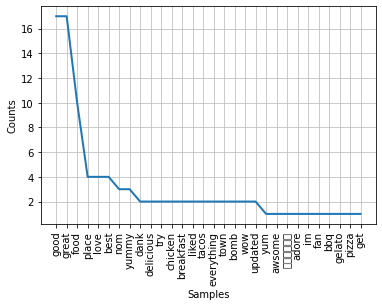

In [ ]:
pos_words_split = []
for i in range(0,100): 
    for word in positive_star['text'][i]:
        pos_words_split.append(word)
FreqDist(pos_words_split).plot(30, cumulative=False)


In [ ]:
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(positive_star['text'].values))


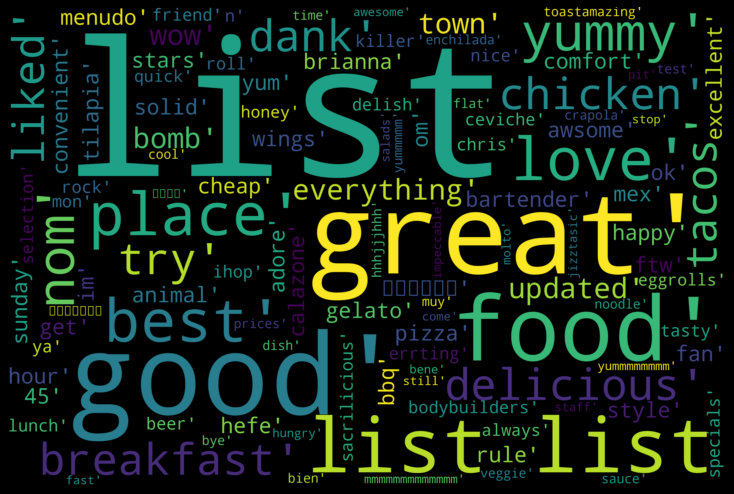

In [ ]:
fig = plt.figure(
    figsize = (10, 7),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)

## **Wordcloud of Neutral Ratings:**


In [ ]:
neutral_star = star3.copy()
neutral_star['text'] = neutral_star['text'].apply(remove_punc_stopword)
neutral_star.count()

stars             100
text              100
length_of_text    100
date              100
business_id       100
dtype: int64

In [ ]:
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(neutral_star['text'].values))


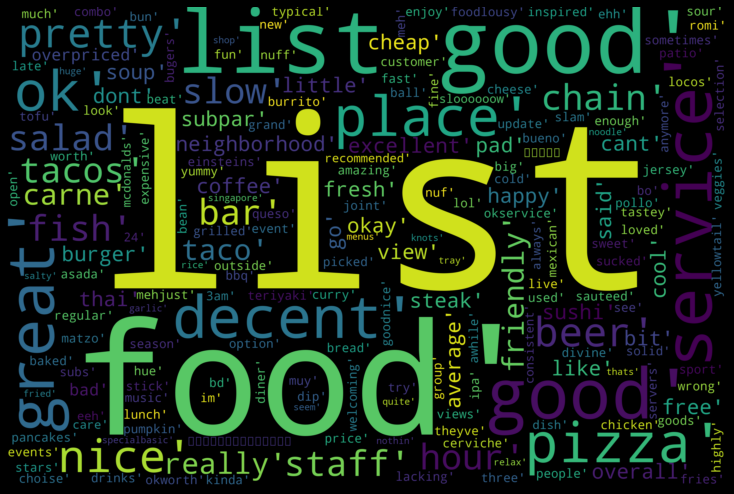

In [ ]:
fig = plt.figure(
    figsize = (10, 7),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)


## **Wordcloud of Negative Ratings:**

In [ ]:
negative_star = star1.merge(star2, how='outer')


In [ ]:
negative_star['text'] = negative_star['text'].apply(remove_punc_stopword)
negative_star.count()

stars             100
text              100
length_of_text    100
date              100
business_id       100
dtype: int64

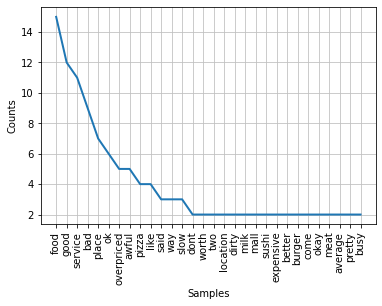

In [ ]:
neg_words_split = []
for i in range(0,100): 
    for word in negative_star['text'][i]:
        neg_words_split.append(word)
FreqDist(neg_words_split).plot(30, cumulative=False)


In [ ]:
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(negative_star['text'].values))

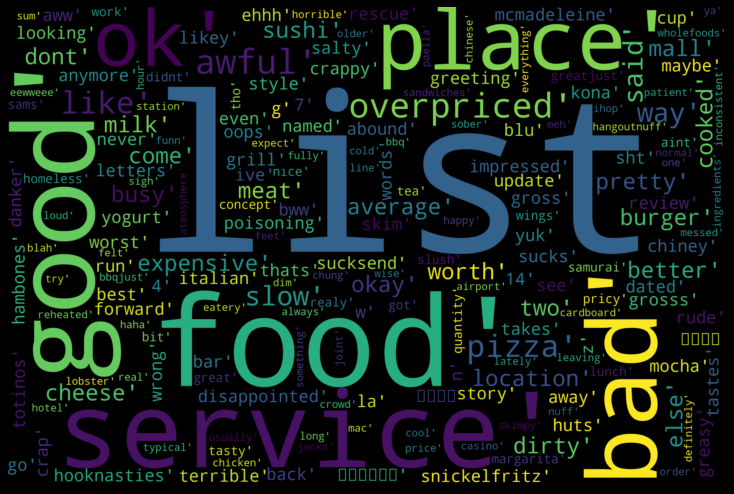

In [ ]:
fig = plt.figure(
    figsize = (10, 7),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)